# Projet 2 : Analysez des données de systèmes éducatifs

# Analyse exploratoire de *academy*

<a id="0"></a> <br>
# Table of Contents  

1. [Premières observations sur le data set](#1)     
    * [1.1 EdStatsData.csv](#2) 
    * [1.2 EdStatsCountry.csv](#3)
    * [1.3 EdStatsCountry-Series.csv](#4)
    * [1.4 EdStatsSeries.csv](#5)
    * [1.5 EdStatsFootNote.csv](#6)
1. [Nettoyage des données](#7)     
    * [2.1 Suppression des colonnes *Unnamed*](#8) 
    * [2.2 Colonne *Year* de *EdStatsFootNote.csv*](#9)
    * [2.3 Données dupliquées](#10)
    * [2.4 Données manquantes](#11)
    * [2.5 Sélection des années](#12)
    * [2.6 Premier filtrage des pays](#13)
1. [Étude des indicateurs](#14) 
    * [3.1 Sélection des indicateurs](#15) 
    * [3.2 Ordres de grandeurs des indicateurs](#16) 
    * [3.3 Indicateurs par région](#17) 
1. [Scoring et Sélection des pays](#18)
1. [Analyse prospective](#19) 
1. [Conclusion](#20) 
    
    

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

##  <a id="1"></a> 1. Premières observations sur le data set

Pour chaque dataframe nous allons créer une variable qui conservera les données initiales et une copie sur laquelle nous effectuerons les modifications nécéssaires par la suite.

Nous allons tout d'abord observer chaque dataframe un par un afin d'avoir une première approche sur les données disponibles et leur interprétation.

### <a id="2"></a> 1.1 *EdStatsData.csv*

In [2]:
data = pd.read_csv('EdStatsData.csv')

In [3]:
data_original = data.copy()

In [4]:
data.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
data.shape

(886930, 70)

In [6]:
data.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1970              float64
                   ...   
2085              float64
2090              float64
2095              float64
2100              float64
Unnamed: 69       float64
Length: 70, dtype: object

In [7]:
data.columns.unique()

Index(['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code',
       '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2020', '2025', '2030', '2035', '2040', '2045',
       '2050', '2055', '2060', '2065', '2070', '2075', '2080', '2085', '2090',
       '2095', '2100', 'Unnamed: 69'],
      dtype='object')

In [8]:
data['Indicator Name'].unique()

array(['Adjusted net enrolment rate, lower secondary, both sexes (%)',
       'Adjusted net enrolment rate, lower secondary, female (%)',
       'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)',
       ..., 'Youth literacy rate, population 15-24 years, female (%)',
       'Youth literacy rate, population 15-24 years, gender parity index (GPI)',
       'Youth literacy rate, population 15-24 years, male (%)'],
      dtype=object)

In [9]:
data['Country Name'].unique()

array(['Arab World', 'East Asia & Pacific',
       'East Asia & Pacific (excluding high income)', 'Euro area',
       'Europe & Central Asia',
       'Europe & Central Asia (excluding high income)', 'European Union',
       'Heavily indebted poor countries (HIPC)', 'High income',
       'Latin America & Caribbean',
       'Latin America & Caribbean (excluding high income)',
       'Least developed countries: UN classification',
       'Low & middle income', 'Low income', 'Lower middle income',
       'Middle East & North Africa',
       'Middle East & North Africa (excluding high income)',
       'Middle income', 'North America', 'OECD members', 'South Asia',
       'Sub-Saharan Africa', 'Sub-Saharan Africa (excluding high income)',
       'Upper middle income', 'World', 'Afghanistan', 'Albania',
       'Algeria', 'American Samoa', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain',


In [10]:
data['Indicator Name'].nunique()

3665

In [11]:
data['Country Name'].nunique()

242

In [12]:
data['Indicator Name'].nunique() * data['Country Name'].nunique()

886930

In [13]:
data['Indicator Name'].nunique() * data['Country Name'].nunique() == data.shape[0]

True

Nous constatons ici que le nombre de valeurs uniques de *Indicator Name* multiplié par le nombre de valeurs uniques de *Country Name* vaut le nombre de lignes total du dataframe. Nous pouvons en déduire que chaque ligne du dataframe correspond à un couple unique composé d'un pays et d'un indicateur.

Nous pouvons également constater que *Country Name* comporte 242 valeurs uniques. Or d'après l'Organisation des Nations Unies (ONU), seuls 197 pays sont reconnus indépendants. En effet, *Country Name* est également composé de zones comme par exemple *Euro area*, *High income* ou encore *Middle East & North Africa*.


In [14]:
country_unique = data['Country Name'].unique()
print(country_unique)
zones = country_unique[:25,]

['Arab World' 'East Asia & Pacific'
 'East Asia & Pacific (excluding high income)' 'Euro area'
 'Europe & Central Asia' 'Europe & Central Asia (excluding high income)'
 'European Union' 'Heavily indebted poor countries (HIPC)' 'High income'
 'Latin America & Caribbean'
 'Latin America & Caribbean (excluding high income)'
 'Least developed countries: UN classification' 'Low & middle income'
 'Low income' 'Lower middle income' 'Middle East & North Africa'
 'Middle East & North Africa (excluding high income)' 'Middle income'
 'North America' 'OECD members' 'South Asia' 'Sub-Saharan Africa'
 'Sub-Saharan Africa (excluding high income)' 'Upper middle income'
 'World' 'Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra'
 'Angola' 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Australia'
 'Austria' 'Azerbaijan' 'Bahamas, The' 'Bahrain' 'Bangladesh' 'Barbados'
 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan' 'Bolivia'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'British

In [15]:
list_countries = data[~data['Country Name'].isin(zones)]['Country Name'].unique()
print(list_countries)

['Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas, The' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan' 'Bolivia'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'British Virgin Islands'
 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde'
 'Cambodia' 'Cameroon' 'Canada' 'Cayman Islands'
 'Central African Republic' 'Chad' 'Channel Islands' 'Chile' 'China'
 'Colombia' 'Comoros' 'Congo, Dem. Rep.' 'Congo, Rep.' 'Costa Rica'
 "Cote d'Ivoire" 'Croatia' 'Cuba' 'Curacao' 'Cyprus' 'Czech Republic'
 'Denmark' 'Djibouti' 'Dominica' 'Dominican Republic' 'Ecuador'
 'Egypt, Arab Rep.' 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia'
 'Ethiopia' 'Faroe Islands' 'Fiji' 'Finland' 'France' 'French Polynesia'
 'Gabon' 'Gambia, The' 'Georgia' 'Germany' 'Ghana' 'Gibraltar' 'Greece'
 'Greenland' 'Grenada' 'Guam' 'Guatemala' 'G

In [16]:
list_countries.shape

(217,)

Nous observons que la variable *Country Name* est composée des 197 pays reconnus indépendants par l'ONU mais aussi de subdivisions de certains pays comme par exemple la Polynésie Française, Curaçao ou encore l'Île de Man. C'est la raison pour laquelle la variable *Country Name* à laquelle on a retiré les régions comporte toujours 217 pays recencés au lieu de 197.

In [17]:
data.describe()

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
count,7.228800e+04,3.553700e+04,3.561900e+04,3.554500e+04,3.573000e+04,8.730600e+04,3.748300e+04,3.757400e+04,3.757600e+04,3.680900e+04,...,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,0.0
mean,1.974772e+09,4.253638e+09,4.592365e+09,5.105006e+09,5.401493e+09,2.314288e+09,5.731808e+09,6.124437e+09,6.671489e+09,7.436724e+09,...,7.224868e+02,7.271290e+02,7.283779e+02,7.266484e+02,7.228327e+02,7.176899e+02,7.113072e+02,7.034274e+02,6.940296e+02,NaN
std,1.211687e+11,1.804814e+11,1.914083e+11,2.059170e+11,2.112150e+11,1.375059e+11,2.215546e+11,2.325489e+11,2.473986e+11,2.660957e+11,...,2.215845e+04,2.287990e+04,2.352338e+04,2.408149e+04,2.455897e+04,2.496587e+04,2.530183e+04,2.556069e+04,2.574189e+04,NaN
min,-1.435564e+00,-1.594625e+00,-3.056522e+00,-4.032582e+00,-4.213563e+00,-3.658569e+00,-2.950945e+00,-3.174870e+00,-3.558749e+00,-2.973612e+00,...,-1.630000e+00,-1.440000e+00,-1.260000e+00,-1.090000e+00,-9.200000e-01,-7.800000e-01,-6.500000e-01,-5.500000e-01,-4.500000e-01,NaN
25%,8.900000e-01,8.853210e+00,9.240920e+00,9.595200e+00,9.861595e+00,1.400000e+00,9.312615e+00,9.519913e+00,1.000000e+01,1.000000e+01,...,3.000000e-02,3.000000e-02,2.000000e-02,2.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,NaN
50%,6.317724e+00,6.316240e+01,6.655139e+01,6.969595e+01,7.087760e+01,9.677420e+00,7.101590e+01,7.133326e+01,7.290512e+01,7.510173e+01,...,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.200000e-01,NaN
75%,6.251250e+01,5.655200e+04,5.863650e+04,6.202900e+04,6.383675e+04,7.854163e+01,5.682800e+04,5.739175e+04,5.940425e+04,6.411500e+04,...,7.505000e+00,7.500000e+00,7.300000e+00,7.100000e+00,6.722500e+00,6.080000e+00,5.462500e+00,4.680000e+00,4.032500e+00,NaN
max,1.903929e+13,1.986457e+13,2.100916e+13,2.238367e+13,2.282991e+13,2.300634e+13,2.424128e+13,2.521383e+13,2.622101e+13,2.730873e+13,...,2.951569e+06,3.070879e+06,3.169711e+06,3.246239e+06,3.301586e+06,3.337871e+06,3.354746e+06,3.351887e+06,3.330484e+06,NaN


Le dataframe *data* comporte 886 930 observations et 70 variables. Il donne l’évolution de nombreux indicateurs pour tous les pays et certains groupes de pays ou subdivisions. On constate que chaque ligne correspond à un couple unique composé d'un pays et d'un indicateur. En effet, pour chaque pays, il y a la liste de tous les indicateurs. En ce qui concerne les variables, nous avons le nom et le code de chaque pays ainsi que le nom et le code de chaque indicateur. À la suite de cela, on retrouve les valeurs historiques correspondant au couple pays/indicateur sur chaque année de 1970 à 2017. Puis de 2020 à 2100, nous avons, tous les 5 ans, les valeurs théoriques futures de ces indicateurs.

La variable *Country Name* est composée des 193 états membres ainsi que des 4 pays reconnus indépendants par l'ONU mais aussi de zones et de subdivisions de certains pays. 

Nous observons également une colonne *Unnamed: 69* qui semble inutile et que nous étudierons et supprimerons si nécessaire par la suite. 

### <a id="3"></a> 1.2 *EdStatsCountry.csv*

In [19]:
country = pd.read_csv('EdStatsCountry.csv')

In [20]:
country_original = country.copy()

In [21]:
country.head()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,...,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,...,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,...,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,...,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09",Living Standards Measurement Study Survey (LSM...,Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,...,NaN,2011. Population figures compiled from adminis...,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN


In [22]:
country.dtypes

Country Code                                          object
Short Name                                            object
Table Name                                            object
Long Name                                             object
2-alpha code                                          object
Currency Unit                                         object
Special Notes                                         object
Region                                                object
Income Group                                          object
WB-2 code                                             object
National accounts base year                           object
National accounts reference year                     float64
SNA price valuation                                   object
Lending category                                      object
Other groups                                          object
System of National Accounts                           object
Alternative conversion f

In [23]:
country.columns.unique()

Index(['Country Code', 'Short Name', 'Table Name', 'Long Name', '2-alpha code',
       'Currency Unit', 'Special Notes', 'Region', 'Income Group', 'WB-2 code',
       'National accounts base year', 'National accounts reference year',
       'SNA price valuation', 'Lending category', 'Other groups',
       'System of National Accounts', 'Alternative conversion factor',
       'PPP survey year', 'Balance of Payments Manual in use',
       'External debt Reporting status', 'System of trade',
       'Government Accounting concept', 'IMF data dissemination standard',
       'Latest population census', 'Latest household survey',
       'Source of most recent Income and expenditure data',
       'Vital registration complete', 'Latest agricultural census',
       'Latest industrial data', 'Latest trade data',
       'Latest water withdrawal data', 'Unnamed: 31'],
      dtype='object')

In [24]:
country.shape

(241, 32)

Le dataframe *country* possède 241 observations et 32 variables. Le nombre d'observations se rapproche du nombre de pays dont était composé le dataframe *data*. Nous allons donc comparer ces deux éléments.

In [25]:
country['Short Name'].unique()

array(['Aruba', 'Afghanistan', 'Angola', 'Albania', 'Andorra',
       'Arab World', 'United Arab Emirates', 'Argentina', 'Armenia',
       'American Samoa', 'Antigua and Barbuda', 'Australia', 'Austria',
       'Azerbaijan', 'Burundi', 'Belgium', 'Benin', 'Burkina Faso',
       'Bangladesh', 'Bulgaria', 'Bahrain', 'The Bahamas',
       'Bosnia and Herzegovina', 'Belarus', 'Belize', 'Bermuda',
       'Bolivia', 'Brazil', 'Barbados', 'Brunei', 'Bhutan', 'Botswana',
       'Central African Republic', 'Canada', 'Switzerland',
       'Channel Islands', 'Chile', 'China', "Côte d'Ivoire", 'Cameroon',
       'Dem. Rep. Congo', 'Congo', 'Colombia', 'Comoros', 'Cabo Verde',
       'Costa Rica', 'Cuba', 'Curaçao', 'Cayman Islands', 'Cyprus',
       'Czech Republic', 'Germany', 'Djibouti', 'Dominica', 'Denmark',
       'Dominican Republic', 'Algeria',
       'East Asia & Pacific (developing only)',
       'East Asia & Pacific (all income levels)',
       'Europe & Central Asia (developing only)',


In [26]:
country['Short Name'].nunique()

241

In [27]:
country_not_in_country = data[~data['Country Name'].isin(country['Short Name'])]['Country Name'].unique()
print(country_not_in_country)

['East Asia & Pacific' 'East Asia & Pacific (excluding high income)'
 'Europe & Central Asia' 'Europe & Central Asia (excluding high income)'
 'Latin America & Caribbean'
 'Latin America & Caribbean (excluding high income)'
 'Middle East & North Africa'
 'Middle East & North Africa (excluding high income)' 'Sub-Saharan Africa'
 'Sub-Saharan Africa (excluding high income)' 'Bahamas, The'
 'British Virgin Islands' 'Brunei Darussalam' 'Congo, Dem. Rep.'
 'Congo, Rep.' "Cote d'Ivoire" 'Curacao' 'Egypt, Arab Rep.'
 'Faroe Islands' 'Gambia, The' 'Iran, Islamic Rep.'
 'Korea, Dem. People’s Rep.' 'Korea, Rep.' 'Macedonia, FYR'
 'Micronesia, Fed. Sts.' 'Russian Federation' 'Sao Tome and Principe'
 'Venezuela, RB' 'Virgin Islands (U.S.)' 'Yemen, Rep.']


In [28]:
country_not_in_country.shape

(30,)

In [29]:
country_not_in_data = country[~country['Short Name'].isin(data['Country Name'])]['Short Name'].unique()
print(country_not_in_data)

['The Bahamas' 'Brunei' "Côte d'Ivoire" 'Dem. Rep. Congo' 'Congo'
 'Curaçao' 'East Asia & Pacific (developing only)'
 'East Asia & Pacific (all income levels)'
 'Europe & Central Asia (developing only)'
 'Europe & Central Asia (all income levels)' 'Egypt' 'Faeroe Islands'
 'Micronesia' 'The Gambia' 'Iran' 'Korea'
 'Latin America & Caribbean (developing only)'
 'Latin America & Caribbean (all income levels)'
 'Middle East & North Africa (all income levels)' 'Macedonia'
 'Middle East & North Africa (developing only)' "Dem. People's Rep. Korea"
 'Russia' 'Sub-Saharan Africa (developing only)'
 'Sub-Saharan Africa (all income levels)' 'São Tomé and Principe'
 'Venezuela' 'Virgin Islands' 'Yemen']


In [30]:
country_not_in_data.shape

(29,)

Nous constatons que les pays non compris dans le dataframe *country* et les pays non compris dans le dataframe *data* (c'est à dire les pays qui différent d'un dataframe à l'autre) sont en réalité les mêmes mais orthographiés différemment. Le seul pays qui est compris dans le dataframe *data* mais pas dans le dataframe *country* correspond aux Iles Vierges qui, dans le dataframe *data* sont décomposées en 2 pour la partie américaine et la partie anglaise. Nous privilégierons la variable *Country Name* du dataframe *data* car cette dernière ne comporte pas de caractère spéciaux et les intitulés des zones sont plus explicites. 

Dans ce dataframe, pour chaque pays sont renseignés un certain nombre d'informations telles que la monnaie utilisée, la région ou encore le groupe de revenu auquel il appartient. Cela nous permet de visualiser quelles catégories sont présentent en plus grand nombre. 

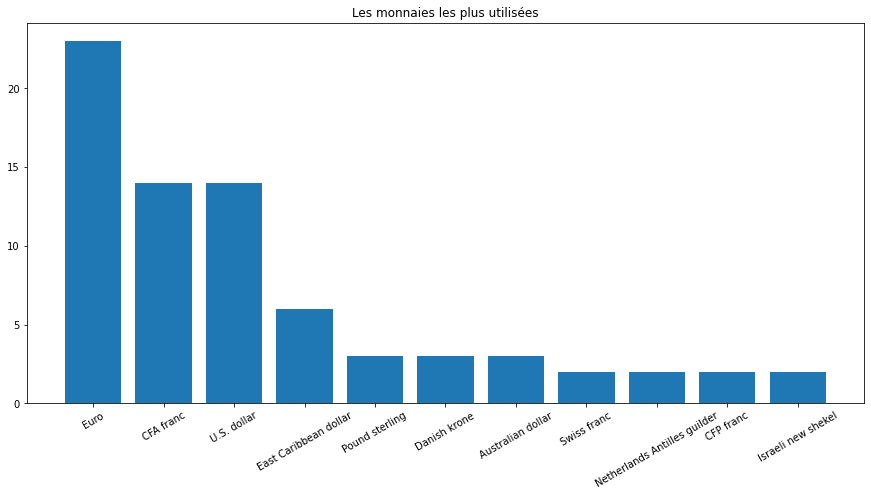

In [31]:
plt.figure(figsize=(15,7))
plt.bar(x = country['Currency Unit'].value_counts().sort_values(ascending=False).head(11).index,
        height = country['Currency Unit'].value_counts().sort_values(ascending=False).head(11), 
        )
plt.tick_params(axis = 'x', rotation = 30)
plt.title('Les monnaies les plus utilisées')
plt.show()

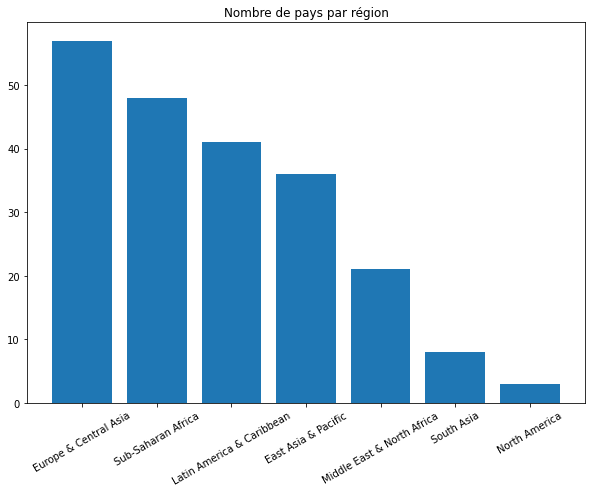

In [32]:
plt.figure(figsize=(10,7))
plt.bar(x = country['Region'].value_counts().sort_values(ascending=False).index,
        height = country['Region'].value_counts().sort_values(ascending=False), 
        )
plt.tick_params(axis = 'x', rotation = 30)
plt.title('Nombre de pays par région')
plt.show()

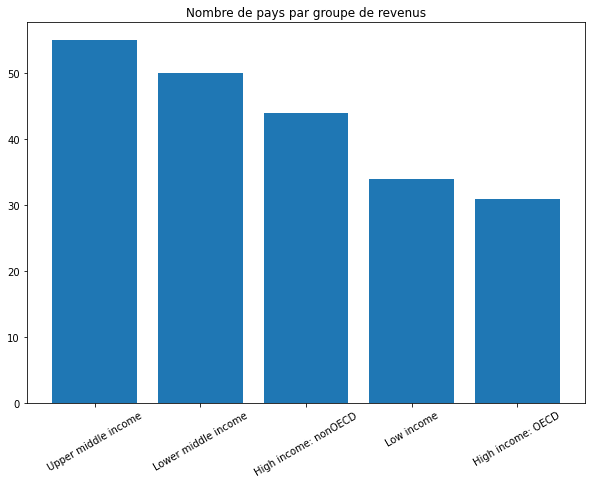

In [33]:
plt.figure(figsize=(10,7))
plt.bar(x = country['Income Group'].value_counts().sort_values(ascending=False).index,
        height = country['Income Group'].value_counts().sort_values(ascending=False), 
        )
plt.tick_params(axis = 'x', rotation = 30)
plt.title('Nombre de pays par groupe de revenus')
plt.show()

On constate que les revenus moyens inférieurs et supérieurs sont les plus représentés. 

Le dataframe *EdStatsCountry.csv* est composé de 241 observations et 32 variables. 
Ses observations correspondent au nombre de pays recencés dans le dataframe *EdStatsData* (à l'exception des Iles Vierges qui sont séparées en 2 pour la partie américaine et la partie anglaise). 
Les variables correspondent à des informations économiques concernant les différents pays.

Encore une fois, le dataframe semble composé d'une variable *Unnamed: 31* qui semble inutile et que nous étudierons et supprimerons si nécessaire par la suite. 

### <a id="4"></a> 1.3 *EdStatsCountry-Series.csv*

In [34]:
country_series = pd.read_csv('EdStatsCountry-Series.csv')

In [35]:
country_series_original = country_series.copy()

In [36]:
country_series.head()

,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN


In [37]:
country_series.shape

(613, 4)

Notre dataframe *EdStatsCountry-Series.csv* nommé *country_series* possède 4 variables et 613 observations.

In [38]:
country_series['CountryCode'].nunique()

211

Il ne semble pas y avoir le même nombre de pays dans *country* et *country_series*.

In [39]:
country_differents = country[~country['Country Code'].isin(country_series['CountryCode'].unique())][['Short Name']]
country_differents

,Short Name
5,Arab World
47,Curaçao
57,East Asia & Pacific (developing only)
58,East Asia & Pacific (all income levels)
59,Europe & Central Asia (developing only)
60,Europe & Central Asia (all income levels)
63,Euro area
68,European Union
89,High income
92,Heavily indebted poor countries (HIPC)


In [40]:
country_differents.shape

(30, 1)

Il y a donc 30 pays en plus dans le dataframe *country* par rapport à *country_series*. Le dataframe ne comporte donc pas les zones.

Le dataframe *EdStatsCountry-Series.csv* est composé de 4 variables et 613 observations. Il repertorie les sources des données concernant les pays représentés par le *CountryCode*.

Encore une fois, le dataframe semble composé d'une variable *Unnamed: 3* qui semble inutile et que nous étudierons et supprimerons si nécessaire par la suite. 


### <a id="5"></a> 1.4 *EdStatsSeries.csv*

In [41]:
series = pd.read_csv('EdStatsSeries.csv')

In [42]:
series_original = series.copy()

In [43]:
series.head()

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,Percentage of population age 15+ with no educa...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 20-24 with...,Percentage of female population age 20-24 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
series.shape

(3665, 21)

In [45]:
series.dtypes

Series Code                             object
Topic                                   object
Indicator Name                          object
Short definition                        object
Long definition                         object
Unit of measure                        float64
Periodicity                             object
Base Period                             object
Other notes                             object
Aggregation method                      object
Limitations and exceptions              object
Notes from original source             float64
General comments                        object
Source                                  object
Statistical concept and methodology     object
Development relevance                   object
Related source links                    object
Other web links                        float64
Related indicators                     float64
License Type                           float64
Unnamed: 20                            float64
dtype: object

In [46]:
series.columns

Index(['Series Code', 'Topic', 'Indicator Name', 'Short definition',
       'Long definition', 'Unit of measure', 'Periodicity', 'Base Period',
       'Other notes', 'Aggregation method', 'Limitations and exceptions',
       'Notes from original source', 'General comments', 'Source',
       'Statistical concept and methodology', 'Development relevance',
       'Related source links', 'Other web links', 'Related indicators',
       'License Type', 'Unnamed: 20'],
      dtype='object')

Le dataframe donne des informations supplémentaires sur les indicateurs. Nous allons vérifier qu'il comporte bien les mêmes indicateurs que le dataframe *data*.

In [47]:
series['Series Code'].nunique() == data['Indicator Code'].nunique()

True

Le dataframe *EdStatsSeries.csv* est composé de 3665 observations et 21 variables. Il représente les indicateurs du dataframe *data*, ainsi que des informations les concernant (telles que leur définition, leur méthode d'agrégation ou leur source).

Encore une fois, le dataframe semble composé d'une variable *Unnamed: 3* qui semble inutile et que nous étudierons et supprimerons si nécessaire par la suite. 


### <a id="6"></a> 1.5 *EdStatsFootNote.csv*

In [48]:
footnote = pd.read_csv('EdStatsFootNote.csv')

In [49]:
footnote_original = footnote.copy()

In [50]:
footnote.head()

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN


In [51]:
footnote.shape

(643638, 5)

In [52]:
footnote.dtypes

CountryCode     object
SeriesCode      object
Year            object
DESCRIPTION     object
Unnamed: 4     float64
dtype: object

Le dataframe *footnote* est composé de 643 638 observations et 5 variables.

In [53]:
footnote['Year'].unique()

array(['YR2001', 'YR2005', 'YR2000', 'YR2004', 'YR2006', 'YR2003',
       'YR1999', 'YR2008', 'YR2002', 'YR2007', 'YR2017', 'YR2010',
       'YR2009', 'YR2011', 'YR2012', 'YR2015', 'YR2014', 'YR1970',
       'YR1971', 'YR1972', 'YR1973', 'YR1974', 'YR1975', 'YR1976',
       'YR1977', 'YR1978', 'YR1979', 'YR1980', 'YR1981', 'YR1982',
       'YR1983', 'YR1984', 'YR1985', 'YR1986', 'YR1987', 'YR1988',
       'YR1989', 'YR1990', 'YR1991', 'YR1992', 'YR1993', 'YR1994',
       'YR1995', 'YR1996', 'YR1997', 'YR1998', 'YR2013', 'YR2016',
       'YR2020', 'YR2025', 'YR2030', 'YR2035', 'YR2040', 'YR2045',
       'YR2050', 'yr2012'], dtype=object)

In [54]:
footnote['DESCRIPTION'].unique().tolist()

['Country estimation.',
 'UIS Estimation',
 'UNESCO Institute for Statistics (UIS) estimate',
 '5-year average value between 0s and 5s',
 'Percentage includes lower secondary education.',
 'Country data',
 'Country Data',
 'UNSD WPP08 revision file 2A and 3A.',
 'Not applicable',
 'Percentage includes all tertiary levels (ISCED 5-8)',
 'Estimated',
 'UIS estimation.',
 '<0.1. Plausible bound is <0.1-0.1',
 'Uncertainty bound is 127.1 - 148.2',
 'Uncertainty bound is 146.6 - 173.2',
 'Uncertainty bound is 134.1 - 157.1',
 'Uncertainty bound is 207.2 - 261.6',
 'Uncertainty bound is 60.2 - 86.1',
 'Uncertainty bound is 184.5 - 227.9',
 'Uncertainty bound is 167.8 - 201.7',
 'Uncertainty bound is 130.4 - 152.5',
 'Uncertainty bound is 240.3 - 308.5',
 'Country estimation',
 'Uncertainty bound is 212.6 - 269.3',
 'Uncertainty bound is 201.4 - 253.3',
 'Uncertainty bound is 190.1 - 236.6',
 'Uncertainty bound is 162.4 - 193.8',
 'Uncertainty bound is 123.7 - 144.2',
 'Uncertainty bound is 9

In [55]:
footnote['SeriesCode'].nunique() == data['Indicator Code'].nunique()

False

In [56]:
indicateurs_differents = footnote[~footnote['SeriesCode'].isin(data['Indicator Code'].unique())][['SeriesCode']].shape
indicateurs_differents

(2265, 1)

Il semble y avoir 2 265 codes d'indicateurs en plus dans le dataframe *footnote* comparé au dataframe *data*.

Le dataframe *EdStatsFootNote.csv* est composé de 643 638 observations et 5 variables. 
Il représente des informations supplémentaires concernant les données comme leur année et leur description.

Encore une fois, le dataframe semble composé d'une variable *Unnamed: 4* qui semble inutile et que nous étudierons et supprimerons si nécessaire par la suite. 

## <a id="7"></a> 2. Nettoyage des données

### <a id="8"></a> 2.1 Suppression des colonnes *Unnamed*

Nous allons étudier les colonnes *Unnamed* de chacun de nos dataframes et les supprimer si celles-ci n'apportent pas d'information.

In [57]:
print(data['Unnamed: 69'].describe())
print(country['Unnamed: 31'].describe())
print(country_series['Unnamed: 3'].describe())
print(series['Unnamed: 20'].describe())
print(footnote['Unnamed: 4'].describe())

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Unnamed: 69, dtype: float64
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Unnamed: 31, dtype: float64
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Unnamed: 3, dtype: float64
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Unnamed: 20, dtype: float64
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Unnamed: 4, dtype: float64


On constate que chacune des colonnes *Unnamed* de nos dataframes sont inutiles car elles ne comportent que des *NaN*. Nous allons donc procéder à leur suppression.

In [58]:
data = data.drop(['Unnamed: 69'],axis=1)
country = country.drop(['Unnamed: 31'],axis=1)
country_series = country_series.drop(['Unnamed: 3'],axis=1)
series = series.drop(['Unnamed: 20'],axis=1)
footnote = footnote.drop(['Unnamed: 4'],axis=1)

### <a id="9"></a> 2.2 Colonne *Year* de *EdStatsFootNote.csv*

La colonne *Year* comporte des années précédées de 2 lettres 'YR'. Nous souhaitons éliminer ces lettres afin de ne garder que l'année et ainsi harmoniser le type de données par rapport aux autres dataframes. 

In [59]:
footnote['Year'].unique()

array(['YR2001', 'YR2005', 'YR2000', 'YR2004', 'YR2006', 'YR2003',
       'YR1999', 'YR2008', 'YR2002', 'YR2007', 'YR2017', 'YR2010',
       'YR2009', 'YR2011', 'YR2012', 'YR2015', 'YR2014', 'YR1970',
       'YR1971', 'YR1972', 'YR1973', 'YR1974', 'YR1975', 'YR1976',
       'YR1977', 'YR1978', 'YR1979', 'YR1980', 'YR1981', 'YR1982',
       'YR1983', 'YR1984', 'YR1985', 'YR1986', 'YR1987', 'YR1988',
       'YR1989', 'YR1990', 'YR1991', 'YR1992', 'YR1993', 'YR1994',
       'YR1995', 'YR1996', 'YR1997', 'YR1998', 'YR2013', 'YR2016',
       'YR2020', 'YR2025', 'YR2030', 'YR2035', 'YR2040', 'YR2045',
       'YR2050', 'yr2012'], dtype=object)

In [60]:
footnote['Year'] = footnote['Year'].str.replace('YR', '')
footnote['Year'] = footnote['Year'].str.replace('yr', '')
footnote['Year']= pd.to_numeric(footnote['Year'])

In [61]:
footnote['Year'].sort_values().unique()

array([1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980,
       1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2020, 2025, 2030, 2035, 2040, 2045, 2050])

### <a id="10"></a> 2.3 Données dupliquées

Nous allons vérifier si les dataframes possèdent des doublons.

In [62]:
data.duplicated(keep=False).sum()

0

In [63]:
country.duplicated(keep=False).sum()

0

In [64]:
country_series.duplicated(keep=False).sum()

0

In [65]:
series.duplicated(keep=False).sum()

0

In [66]:
footnote.duplicated(keep=False).sum()

0

Nous constatons qu'aucun des dataframes ne possède de doublons.

### <a id="11"></a> 2.4 Données manquantes

Nous allons désormais aborder les données manquantes dans les différents dataframes. Nous allons observer les taux de remplissage des différentes variables et ainsi nous pourrons commencer à éliminer les variables ou pays pour lesquels nous ne disposons pas de suffisamment de données. 

In [67]:
def missing_data(data):
    #print('Data :',data.name)
    print('Nombre total de cellules manquantes :',data.isna().sum().sum())
    print('Nombre de cellules manquantes en % : {:.2%}'.format(data.isna().sum().sum()/data.size))
    print('Nombre de cellules manquantes pour chaque variable :\n', data.isna().sum().sort_values(ascending=False))

In [68]:
pd.set_option('display.max_rows', 100)
missing_data(data)

Nombre total de cellules manquantes : 52568249
Nombre de cellules manquantes en % : 85.90%
Nombre de cellules manquantes pour chaque variable :
 2017              886787
2016              870470
1971              851393
1973              851385
1972              851311
1974              851200
1979              850121
1976              849447
1982              849419
1989              849390
1977              849356
1978              849354
1983              848470
1988              848378
1984              848324
1987              848289
1981              848153
1986              847558
2030              835494
2025              835494
2020              835494
2075              835494
2100              835494
2035              835494
2085              835494
2040              835494
2045              835494
2050              835494
2055              835494
2060              835494
2080              835494
2065              835494
2070              835494
2095              835494
2090 

In [69]:
missing_data(country)

Nombre total de cellules manquantes : 2113
Nombre de cellules manquantes en % : 28.28%
Nombre de cellules manquantes pour chaque variable :
 National accounts reference year                     209
Alternative conversion factor                        194
Other groups                                         183
Latest industrial data                               134
Vital registration complete                          130
External debt Reporting status                       117
Latest household survey                              100
Latest agricultural census                            99
Lending category                                      97
Special Notes                                         96
PPP survey year                                       96
Source of most recent Income and expenditure data     81
Government Accounting concept                         80
Latest water withdrawal data                          62
Balance of Payments Manual in use                     60
IMF 

In [70]:
missing_data(country_series)

Nombre total de cellules manquantes : 0
Nombre de cellules manquantes en % : 0.00%
Nombre de cellules manquantes pour chaque variable :
 CountryCode    0
SeriesCode     0
DESCRIPTION    0
dtype: int64


In [71]:
missing_data(series)

Nombre total de cellules manquantes : 51538
Nombre de cellules manquantes en % : 70.31%
Nombre de cellules manquantes pour chaque variable :
 License Type                           3665
Notes from original source             3665
Related indicators                     3665
Other web links                        3665
Unit of measure                        3665
Development relevance                  3662
General comments                       3651
Limitations and exceptions             3651
Statistical concept and methodology    3642
Aggregation method                     3618
Periodicity                            3566
Related source links                   3450
Base Period                            3351
Other notes                            3113
Short definition                       1509
Topic                                     0
Source                                    0
Long definition                           0
Indicator Name                            0
Series Code           

In [72]:
missing_data(footnote)

Nombre total de cellules manquantes : 0
Nombre de cellules manquantes en % : 0.00%
Nombre de cellules manquantes pour chaque variable :
 CountryCode    0
SeriesCode     0
Year           0
DESCRIPTION    0
dtype: int64


On constate que les dataframes *data* et *series* comportent un grand nombre de données manquantes (respectivement 85.90% et 70.31%). Dans les deux dataframes, le nombre de données manquantes est du même ordre de grandeur pour toutes les variables en comportant. 

Le dataframe *country* possède quant à lui 28.28% de données manquantes. Ces dernières sont essentiellement concentrées sur quelques variables. 

Les dataframes *country_series* et *footnote* ne comportent aucune données manquantes. 

### <a id="12"></a> 2.5 Sélection des années

Pour réaliser notre projet, nous allons devoir utiliser les valeurs d'indicateurs sur certaines années. 
Dans le cadre de notre problématique, nous devons sélectionner un certain nombre de pays susceptibles d'être pertinents pour un projet d'expansion à l'international de l'entreprise.
Un certain nombre de critères sont à prendre en compte, notamment : des critères démographiques et économiques, des critères d'accès à l'éducation mais également des critères d'accès à la technologie. Nous reviendrons plus en détail sur ces critères lors de la sélection des indicateurs pertinents à notre analyse.

Pour le moment, le critère d'accès à la technologie nous interesse pour selectionner les années pertinentes pour notre analyse. En effet, Internet n'apparait qu'à partir des années 1990 et ne connait un essor qu'à partir des années 2000. Il paraît donc assez intéressant de se concentrer sur les années comprises entre 2000 et 2017. 

Afin d'affiner et confirmer cette idée, nous allons étudier plus en détail les données présentent en fonction des années.

Nous allons représenter le nombre de données présentes par année pour le dataframe *data* afin d'avoir un premier aperçu de la répartition des données. 

In [73]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Data columns (total 69 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Country Name    886930 non-null  object 
 1   Country Code    886930 non-null  object 
 2   Indicator Name  886930 non-null  object 
 3   Indicator Code  886930 non-null  object 
 4   1970            72288 non-null   float64
 5   1971            35537 non-null   float64
 6   1972            35619 non-null   float64
 7   1973            35545 non-null   float64
 8   1974            35730 non-null   float64
 9   1975            87306 non-null   float64
 10  1976            37483 non-null   float64
 11  1977            37574 non-null   float64
 12  1978            37576 non-null   float64
 13  1979            36809 non-null   float64
 14  1980            89122 non-null   float64
 15  1981            38777 non-null   float64
 16  1982            37511 non-null   float64
 17  1983      

Nous allons utiliser le package *missingno* qui fournit un petit ensemble d'outils de visualisations et d'utilitaires de données manquantes.

In [74]:
pip install missingno 

Note: you may need to restart the kernel to use updated packages.


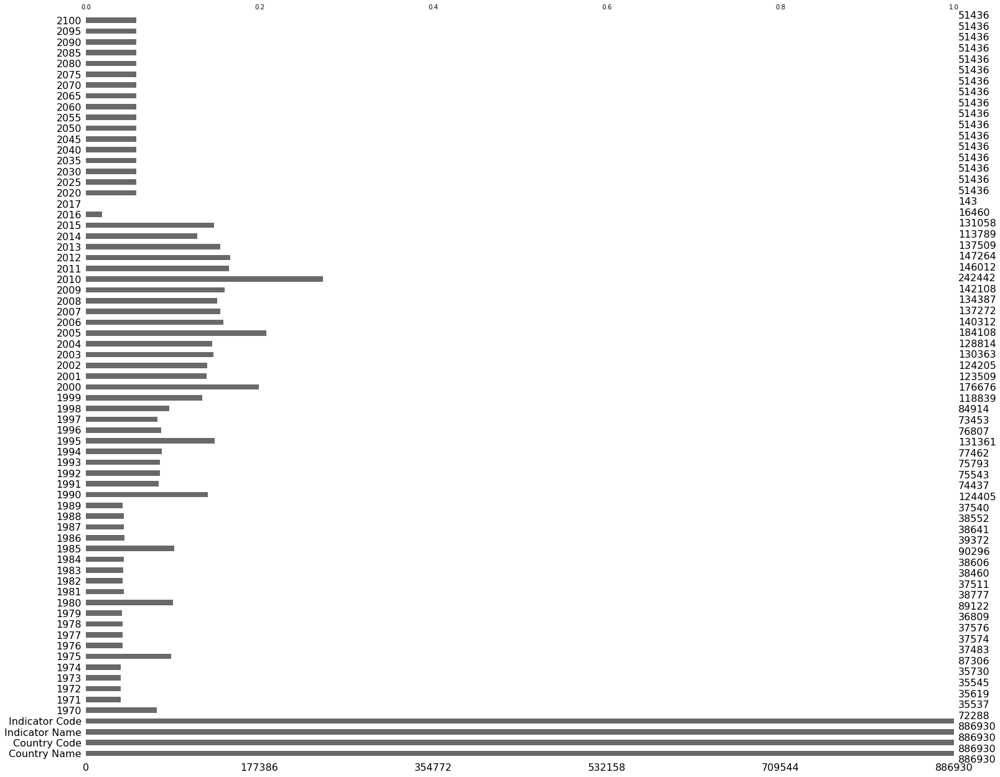

In [75]:
import missingno as msno
%matplotlib inline
msno.bar(data)
plt.title('Nombre de données présentes par variable', size=15)
plt.show()
plt.savefig('missing_data.pdf')

*missingno.bar()* nous permet de visualiser sous la forme d'un diagramme en barres, le nombre de données présentes pour chacune des variables de notre dataframe.

Nous constatons que l'année la plus renseignée est l'année 2010. Nous pourrions donc nous concentrer sur cette année pour notre analyse. Cependant, certains pays sont renseignés pour les années suivantes. Il pourrait être intéressant de récupérer ces données pour les pays concernés. Nous allons donc nous concentrer essentiellement sur les données de 2010 à 2017. Pour ce faire, nous allons créer une nouvelle variable qui va récupérer la dernière valeur historique renseignée.

In [76]:
data_c = data.copy()

In [77]:
# Nous créeons un nouveau dataframe récupérant les données prévisionnelles qui nous seront utiles par la suite.
data_futur = data[['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code', '2020', '2025', '2030', 
                  '2035', '2040', '2045','2050', '2055', '2060', '2065', '2070', '2075', '2080', '2085', '2090',
                  '2095', '2100']]
data_futur.head()

,Country Name,Country Code,Indicator Name,Indicator Code,2020,2025,2030,2035,2040,2045,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
data_futur = data_futur.merge(right = country[['Country Code', 'Region']], 
                  on='Country Code', how='left')

In [79]:
data_futur.describe()

,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
count,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04
mean,5.780697e+02,6.054774e+02,6.315916e+02,6.556516e+02,6.751516e+02,6.911287e+02,7.040640e+02,7.145788e+02,7.224868e+02,7.271290e+02,7.283779e+02,7.266484e+02,7.228327e+02,7.176899e+02,7.113072e+02,7.034274e+02,6.940296e+02
std,1.475072e+04,1.577305e+04,1.678556e+04,1.778666e+04,1.874408e+04,1.965409e+04,2.052941e+04,2.136851e+04,2.215845e+04,2.287990e+04,2.352338e+04,2.408149e+04,2.455897e+04,2.496587e+04,2.530183e+04,2.556069e+04,2.574189e+04
min,-1.870000e+00,-2.000000e+00,-2.110000e+00,-2.150000e+00,-2.140000e+00,-2.090000e+00,-1.980000e+00,-1.830000e+00,-1.630000e+00,-1.440000e+00,-1.260000e+00,-1.090000e+00,-9.200000e-01,-7.800000e-01,-6.500000e-01,-5.500000e-01,-4.500000e-01
25%,6.000000e-02,6.000000e-02,6.000000e-02,6.000000e-02,5.000000e-02,5.000000e-02,4.000000e-02,3.000000e-02,3.000000e-02,3.000000e-02,2.000000e-02,2.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02
50%,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.200000e-01
75%,6.660000e+00,6.900000e+00,7.062500e+00,7.300000e+00,7.400000e+00,7.432500e+00,7.500000e+00,7.500000e+00,7.505000e+00,7.500000e+00,7.300000e+00,7.100000e+00,6.722500e+00,6.080000e+00,5.462500e+00,4.680000e+00,4.032500e+00
max,1.599479e+06,1.781898e+06,1.967258e+06,2.151416e+06,2.330336e+06,2.500439e+06,2.662071e+06,2.813670e+06,2.951569e+06,3.070879e+06,3.169711e+06,3.246239e+06,3.301586e+06,3.337871e+06,3.354746e+06,3.351887e+06,3.330484e+06


In [80]:
data_all = data[['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code','2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017']]
data_all.head()

,Country Name,Country Code,Indicator Name,Indicator Code,2010,2011,2012,2013,2014,2015,2016,2017
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,85.211998,85.24514,86.101669,85.51194,85.320152,NaN,NaN,NaN


In [81]:
data_fill = data[['2010', '2011', '2012', '2013', '2014','2015', '2016', '2017']]
data_fill.head()

,2010,2011,2012,2013,2014,2015,2016,2017
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,85.211998,85.24514,86.101669,85.51194,85.320152,NaN,NaN,NaN


In [82]:
data_fill = data_fill.fillna(method='ffill',axis=1)
data_fill.head()

,2010,2011,2012,2013,2014,2015,2016,2017
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,85.211998,85.24514,86.101669,85.51194,85.320152,85.320152,85.320152,85.320152


In [83]:
data_all['last year'] = data_fill['2017']

<ipython-input-83-7b6b41cec27e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_all['last year'] = data_fill['2017']


In [84]:
data_all.head()

,Country Name,Country Code,Indicator Name,Indicator Code,2010,2011,2012,2013,2014,2015,2016,2017,last year
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,85.211998,85.24514,86.101669,85.51194,85.320152,NaN,NaN,NaN,85.320152


In [85]:
data_all['last year'].describe()

count    3.142750e+05
mean     1.145185e+10
std      6.868531e+11
min     -6.157480e+05
25%      2.000000e+00
50%      2.434135e+01
75%      5.270000e+02
max      1.206030e+14
Name: last year, dtype: float64

In [86]:
data_all['last year'].isna().sum()

572655

In [87]:
data_all = data_all.merge(right = country[['Country Code', 'Region']], 
                  on='Country Code', how='left')

In [88]:
data_all.head()

,Country Name,Country Code,Indicator Name,Indicator Code,2010,2011,2012,2013,2014,2015,2016,2017,last year,Region
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,85.211998,85.24514,86.101669,85.51194,85.320152,NaN,NaN,NaN,85.320152,NaN


### <a id="13"></a> 2.6 Premier filtrage des pays

Nous supprimons de notre data set les pays qui ont moins de 1 million d'habitants car ils ne nous interesserons pas pour notre étude d'expansion à l'international de l'entreprise *academy*.

In [89]:
sort_pop = data_all.loc[data_all['Indicator Code']=='SP.POP.TOTL',['Country Name','last year']].sort_values(by='last year')
sort_pop

,Country Name,last year
830823,Tuvalu,1.109700e+04
640243,Palau,2.150300e+04
761188,St. Martin (French part),3.126400e+04
691553,San Marino,3.320300e+04
365368,Gibraltar,3.440800e+04
...,...,...
64838,Middle income,5.592833e+09
46513,Low & middle income,6.252106e+09
90493,World,7.442136e+09
193113,British Virgin Islands,NaN


In [90]:
sort_pop.shape

(242, 2)

In [91]:
sort_pop[sort_pop['last year']<1000000].shape

(56, 2)

In [92]:
pays_drop = sort_pop[sort_pop['last year']<1000000]['Country Name'].tolist()
pays_drop

['Tuvalu',
 'Palau',
 'St. Martin (French part)',
 'San Marino',
 'Gibraltar',
 'Turks and Caicos Islands',
 'Liechtenstein',
 'Monaco',
 'Sint Maarten (Dutch part)',
 'Faroe Islands',
 'Marshall Islands',
 'St. Kitts and Nevis',
 'Northern Mariana Islands',
 'American Samoa',
 'Greenland',
 'Cayman Islands',
 'Bermuda',
 'Dominica',
 'Andorra',
 'Isle of Man',
 'Seychelles',
 'Antigua and Barbuda',
 'Virgin Islands (U.S.)',
 'Aruba',
 'Micronesia, Fed. Sts.',
 'Tonga',
 'Grenada',
 'St. Vincent and the Grenadines',
 'Kiribati',
 'Curacao',
 'Guam',
 'Channel Islands',
 'St. Lucia',
 'Samoa',
 'Sao Tome and Principe',
 'Vanuatu',
 'New Caledonia',
 'French Polynesia',
 'Barbados',
 'Iceland',
 'Belize',
 'Bahamas, The',
 'Maldives',
 'Brunei Darussalam',
 'Malta',
 'Cabo Verde',
 'Suriname',
 'Luxembourg',
 'Solomon Islands',
 'Macao SAR, China',
 'Montenegro',
 'Guyana',
 'Comoros',
 'Bhutan',
 'Fiji',
 'Djibouti']

In [93]:
data_all.shape

(886930, 14)

In [94]:
data_all.drop(data_all[data_all['Country Name'].isin(pays_drop)].index, inplace = True)

In [95]:
data_all.shape

(681690, 14)

Nous allons observer le nombre de données par pays afin de pouvoir éliminer une selection de pays ne possédant pas suffisamment de données pour être exploités. 

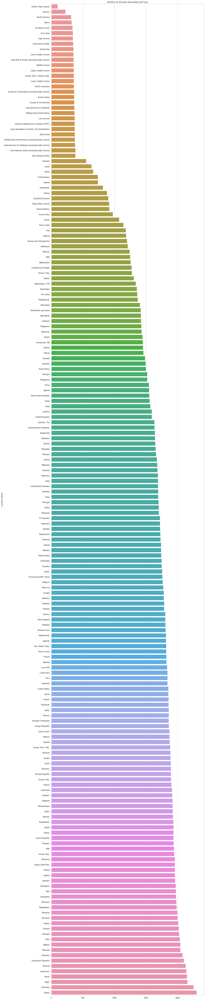

In [96]:
sns.set(style="whitegrid")
plt.figure(figsize=(15, 100))
plt.title("Nombre de données disponibles par Pays")
plot = sns.barplot(x = data_all.groupby('Country Name')[['last year']].count().sum(axis=1).sort_values().values, 
                   y = data_all.groupby('Country Name')[['last year']].count().sum(axis=1).sort_values().index)
plt.show()

On enlève tous les pays ayant moins de 1000 données renseignées.

In [97]:
sort_data = data_all.groupby('Country Name')[['last year']].count().sum(axis=1).sort_values()
sort_data = pd.DataFrame(sort_data, columns = ['Nombre données'])
sort_data

,Nombre données
Country Name,
British Virgin Islands,100
Kosovo,222
North America,312
Nauru,322
European Union,335
...,...
Cameroon,2138
Benin,2148
Niger,2156


In [98]:
pays_drop=sort_data[sort_data['Nombre données']<1000].index
pays_drop

Index(['British Virgin Islands', 'Kosovo', 'North America', 'Nauru',
       'European Union', 'Euro area', 'High income', 'East Asia & Pacific',
       'South Asia', 'Low & middle income',
       'East Asia & Pacific (excluding high income)', 'Middle income',
       'Upper middle income', 'Korea, Dem. People’s Rep.',
       'Lower middle income', 'OECD members',
       'Europe & Central Asia (excluding high income)', 'South Sudan',
       'Europe & Central Asia', 'Latin America & Caribbean',
       'Middle East & North Africa', 'Low income',
       'Heavily indebted poor countries (HIPC)',
       'Least developed countries: UN classification', 'Arab World',
       'Middle East & North Africa (excluding high income)',
       'Latin America & Caribbean (excluding high income)',
       'Sub-Saharan Africa (excluding high income)', 'Sub-Saharan Africa',
       'Somalia', 'Libya', 'World', 'Turkmenistan', 'Angola', 'Uzbekistan',
       'Eritrea', 'Equatorial Guinea', 'Papua New Guinea', 'Gu

In [99]:
len(pays_drop)

40

In [100]:
data_all.drop(data_all[data_all['Country Name'].isin(pays_drop)].index, inplace = True)

In [101]:
data_all.shape

(535090, 14)

In [102]:
data_all['Country Name'].nunique()

146

In [103]:
data_all.groupby(['Region','Country Name','Indicator Code']).mean()

2010  \
Region              Country Name Indicator Code                            
East Asia & Pacific Australia    BAR.NOED.1519.FE.ZS            0.100000   
                                 BAR.NOED.1519.ZS               0.110000   
                                 BAR.NOED.15UP.FE.ZS            0.800000   
                                 BAR.NOED.15UP.ZS               0.720000   
                                 BAR.NOED.2024.FE.ZS            0.100000   
...                                                                  ...   
Sub-Saharan Africa  Zimbabwe     UIS.XUNIT.USCONST.3.FSGOV           NaN   
                                 UIS.XUNIT.USCONST.4.FSGOV           NaN   
                                 UIS.XUNIT.USCONST.56.FSGOV   496.566223   
                                 XGDP.23.FSGOV.FDINSTADM.FFD    0.505270   
                                 XGDP.56.FSGOV.FDINSTADM.FFD    0.397150   

                                                              2011  2012  \
Region              Country Name Indicator Code                            
East Asia & Pacific Australia    BAR.NOED.1519.FE.ZS           NaN   NaN   
                                 BAR.NOED.1519.ZS              NaN   NaN   
                                 BAR.NOED.15UP.FE.ZS           NaN   NaN   
                                 BAR.NOED.15UP.ZS              NaN   NaN   
                                 BAR.NOED.2024.FE.ZS           NaN   NaN   
...                                                            ...   ...   
Sub-Saharan Africa  Zimbabwe     UIS.XUNIT.USCONST.3.FSGOV     NaN   NaN   
                                 UIS.XUNIT.USCONST.4.FSGOV     NaN   NaN   
                                 UIS.XUNIT.USCONST.56.FSGOV    NaN   NaN   
                                 XGDP.23.FSGOV.FDINSTADM.FFD   NaN   NaN   
                                 XGDP.56.FSGOV.FDINSTADM.FFD   NaN   NaN   

                                                              2013  2014  \
Region              Country Name Indicator Code                            
East Asia & Pacific Australia    BAR.NOED.1519.FE.ZS           NaN   NaN   
                                 BAR.NOED.1519.ZS              NaN   NaN   
                                 BAR.NOED.15UP.FE.ZS           NaN   NaN   
                                 BAR.NOED.15UP.ZS              NaN   NaN   
                                 BAR.NOED.2024.FE.ZS           NaN   NaN   
...                                                            ...   ...   
Sub-Saharan Africa  Zimbabwe     UIS.XUNIT.USCONST.3.FSGOV     NaN   NaN   
                                 UIS.XUNIT.USCONST.4.FSGOV     NaN   NaN   
                                 UIS.XUNIT.USCONST.56.FSGOV    NaN   NaN   
                                 XGDP.23.FSGOV.FDINSTADM.FFD   NaN   NaN   
                                 XGDP.56.FSGOV.FDINSTADM.FFD   NaN   NaN   

                                                              2015  2016  \
Region              Country Name Indicator Code                            
East Asia & Pacific Australia    BAR.NOED.1519.FE.ZS           NaN   NaN   
                                 BAR.NOED.1519.ZS              NaN   NaN   
                                 BAR.NOED.15UP.FE.ZS           NaN   NaN   
                                 BAR.NOED.15UP.ZS              NaN   NaN   
                                 BAR.NOED.2024.FE.ZS           NaN   NaN   
...                                                            ...   ...   
Sub-Saharan Africa  Zimbabwe     UIS.XUNIT.USCONST.3.FSGOV     NaN   NaN   
                                 UIS.XUNIT.USCONST.4.FSGOV     NaN   NaN   
                                 UIS.XUNIT.USCONST.56.FSGOV    NaN   NaN   
                                 XGDP.23.FSGOV.FDINSTADM.FFD   NaN   NaN   
                                 XGDP.56.FSGOV.FDINSTADM.FFD   NaN   NaN   

                                                              2017   last year  
Region              Country Nam

## <a id="14"></a> 3. Étude des indicateurs

### <a id="15"></a> 3.1 Sélection des indicateurs

Nous cherchons à déterminer dans quels pays il serait judicieux de développer la présence de l'entreprise. Pour cela, nous devons sélectionner les indicateurs pertinents pour notre problématique. En effet, nous n'allons pas utiliser tous les indicateurs.

L'entreprise *academy* propose des contenus de formation en ligne pour un public de niveau lycée et université. 
Nous allons donc devoir sélectionner des indicateurs :
- démographiques : pour étudier les données sur la tranche d'âge qui nous interesse ou sur la population totale.
- du niveau d'éducation : le nombre de lycéens et étudiants.
- économiques : pour étudier si les potientiels clients peuvent payer les services de l'entreprise (par exemple: PIB par habitant ou encore revenus).
- d'accès à la technologie : pour utiliser les services de l'entreprise les potentiels clients doivent avoir accès à un certain niveau de technologie (par exemple: accès à internet, niveau d'utilisation d'internet).

Nous allons tout d'abord observer quels sont les indicateurs possédant le plus de données. 

In [104]:
pd.set_option('display.max_rows', 10000)
data_all[['Indicator Name', 'last year']].groupby('Indicator Name').count().sort_values(by='last year',ascending=False)

,last year
Indicator Name,
"Labor force, total",146
"Population, male",146
"Population, ages 0-14, male",146
"Population, ages 0-14, total",146
"Unemployment, total (% of total labor force)",146
"Population, ages 15-64 (% of total)",146
"Population, ages 15-64, female",146
"Population, ages 15-64, male",146
"Population, ages 15-64, total",146


Il y a beaucoup d'indicateurs. Certains comportent beaucoup de données et d'autres peu (voir par du tout). Nous pouvons sélectionner un certain nombre d'indicateurs candidats pour répondre à notre problématique parmi les indicateurs comportant un certain nombre de données.
Pour ce faire, nous allons nous aider du site officiel contenant la liste des indicateurs (https://datatopics.worldbank.org/education/indicators).

Notre objectif est de trouver quelques indicateurs qui contiennent des informations pouvant être utiles pour répondre à la problématique de l’entreprise et ainsi faire ressortir les pays cibles pour le développement à l'international de celle-ci. Nous pouvons relever les indicateurs suivants :


- démographique :
 - Population, ages 15-24, total : SP.POP.1524.TO.UN
 - Population, total : SP.POP.TOTL
 
 
- éducation :
 - Enrolment in upper secondary education, both sexes (number) : UIS.E.3
 - Enrolment in post-secondary non-tertiary education, both sexes (number): UIS.E.4
 - Enrolment in tertiary education, all programmes, both sexes (number): SE.TER.ENRL
 - Proportion of 15-24 year-olds enrolled in vocational education, both sexes (%)


- économique :
 - GDP per capita (current US$) : NY.GDP.PCAP.CD
 
 
- accès à la technologie :
 - Internet users (per 100 people) : IT.NET.USER.P2
 - Personal computers (per 100 people) : IT.CMP.PCMP.P2
 

In [105]:
data_all.loc[data_all['Indicator Name']=='Proportion of 15-24 year-olds enrolled in vocational education, both sexes (%)']

,Country Name,Country Code,Indicator Name,Indicator Code,2010,2011,2012,2013,2014,2015,2016,2017,last year,Region


Il semblerait que l'indicateur *'Proportion of 15-24 year-olds enrolled in vocational education, both sexes (%)'* ne soit pas présent dans notre base de données. Nous pouvons dans ce cas l'éliminer de notre sélection.

In [106]:
indicateurs = ['SP.POP.1524.TO.UN', 'SP.POP.TOTL', 'UIS.E.3', 'UIS.E.4', 'SE.TER.ENRL', 'NY.GDP.PCAP.CD',
              'IT.NET.USER.P2', 'IT.CMP.PCMP.P2']

In [107]:
data_all[data_all['Indicator Code'].isin(indicateurs)][['Indicator Name', 'Indicator Code', 'last year']].groupby(['Indicator Name', 'Indicator Code']).count().reset_index().sort_values(by='last year',ascending=False)

,Indicator Name,Indicator Code,last year
4,Internet users (per 100 people),IT.NET.USER.P2,146
7,"Population, total",SP.POP.TOTL,146
3,GDP per capita (current US$),NY.GDP.PCAP.CD,145
6,"Population, ages 15-24, total",SP.POP.1524.TO.UN,145
1,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,135
2,"Enrolment in upper secondary education, both s...",UIS.E.3,135
0,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,87
5,Personal computers (per 100 people),IT.CMP.PCMP.P2,0


Nous constatons que l'indicateur *'Personal computers (per 100 people)'* (IT.CMP.PCMP.P2) a un total de 0. Nous pouvons donc l'éliminer de notre sélection. 

In [108]:
indicateurs.remove('IT.CMP.PCMP.P2')
indicateurs

['SP.POP.1524.TO.UN',
 'SP.POP.TOTL',
 'UIS.E.3',
 'UIS.E.4',
 'SE.TER.ENRL',
 'NY.GDP.PCAP.CD',
 'IT.NET.USER.P2']

In [109]:
data_all[data_all['Indicator Code'].isin(indicateurs)].groupby(['Region','Country Name','Indicator Code']).mean()

2010  \
Region                     Country Name             Indicator Code                    
East Asia & Pacific        Australia                IT.NET.USER.P2     7.600000e+01   
                                                    NY.GDP.PCAP.CD     5.187408e+04   
                                                    SE.TER.ENRL        1.276488e+06   
                                                    SP.POP.1524.TO.UN  2.914315e+06   
                                                    SP.POP.TOTL        2.203175e+07   
                                                    UIS.E.3            9.909510e+05   
                                                    UIS.E.4            2.160520e+05   
                           Cambodia                 IT.NET.USER.P2     1.260000e+00   
                                                    NY.GDP.PCAP.CD     7.856929e+02   
                                                    SE.TER.ENRL        1.951660e+05   
                                                    SP.POP.1524.TO.UN  3.534208e+06   
                                                    SP.POP.TOTL        1.430874e+07   
                                                    UIS.E.3                     NaN   
                                                    UIS.E.4            2.784100e+04   
                           China                    IT.NET.USER.P2     3.430000e+01   
                                                    NY.GDP.PCAP.CD     4.560513e+03   
                                                    SE.TER.ENRL        3.104674e+07   
                                                    SP.POP.1524.TO.UN  2.189740e+08   
                                                    SP.POP.TOTL        1.337705e+09   
                                                    UIS.E.3            4.469317e+07   
                                                    UIS.E.4            2.055470e+05   
                           Hong Kong SAR, China     IT.NET.USER.P2     7.200000e+01   
                                                    NY.GDP.PCAP.CD     3.255000e+04   
                                                    SE.TER.ENRL        2.647610e+05   
                                                    SP.POP.1524.TO.UN  8.862120e+05   
                                                    SP.POP.TOTL        7.024200e+06   
                                                    UIS.E.3            2.671420e+05   
                                                    UIS.E.4            3.110000e+04   
                           Indonesia                IT.NET.USER.P2     1.092000e+01   
                                                    NY.GDP.PCAP.CD     3.113481e+03   
                                                    SE.TER.ENRL        5.001048e+06   
                                                    SP.POP.1524.TO.UN  4.218444e+07   
                                                    SP.POP.TOTL        2.425241e+08   
                                                    UIS.E.3            8.179071e+06   
                                                    UIS.E.4                     NaN   
                           Japan                    IT.NET.USER.P2     7.821000e+01   
                                                    NY.GDP.PCAP.CD     4.450768e+04   
                                                    SE.TER.ENRL        3.836314e+06   
                                                    SP.POP.1524.TO.UN  1.263713e+07   
                                                    SP.POP.TOTL        1.280700e+08   
                                                    UIS.E.3            3.656537e+06   
                                                    UIS.E.4            1.429900e+04   
                           Korea, Rep.              IT.NET.USER.P2     8.370000e+01   
                                                    NY.GDP.PCAP.CD     2.208695e+04   
                                                    SE.TER.ENRL        3.2695

In [110]:
data_final = data_all[data_all['Indicator Code'].isin(indicateurs)]
data_final

,Country Name,Country Code,Indicator Name,Indicator Code,2010,2011,2012,2013,2014,2015,2016,2017,last year,Region
92796,Afghanistan,AFG,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,5.169400e+04,7.696900e+04,9.070000e+04,1.202160e+05,1.452200e+05,NaN,NaN,NaN,1.452200e+05,South Asia
92829,Afghanistan,AFG,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,NaN,9.750400e+04,NaN,NaN,2.628740e+05,NaN,NaN,NaN,2.628740e+05,South Asia
92839,Afghanistan,AFG,"Enrolment in upper secondary education, both s...",UIS.E.3,5.673440e+05,7.434050e+05,8.814150e+05,9.692670e+05,9.687690e+05,NaN,NaN,NaN,9.687690e+05,South Asia
92870,Afghanistan,AFG,GDP per capita (current US$),NY.GDP.PCAP.CD,5.533003e+02,6.035370e+02,6.690091e+02,6.317450e+02,6.120697e+02,5.695779e+02,5.617787e+02,NaN,5.617787e+02,South Asia
93000,Afghanistan,AFG,Internet users (per 100 people),IT.NET.USER.P2,4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00,1.059573e+01,NaN,1.059573e+01,South Asia
94107,Afghanistan,AFG,"Population, ages 15-24, total",SP.POP.1524.TO.UN,6.090239e+06,6.330684e+06,6.569239e+06,6.803785e+06,7.032072e+06,7.252785e+06,NaN,NaN,7.252785e+06,South Asia
94158,Afghanistan,AFG,"Population, total",SP.POP.TOTL,2.880317e+07,2.970860e+07,3.069696e+07,3.173169e+07,3.275802e+07,3.373649e+07,3.465603e+07,NaN,3.465603e+07,South Asia
96461,Albania,ALB,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,NaN,NaN,NaN,1.826000e+03,1.952000e+03,NaN,NaN,NaN,1.952000e+03,Europe & Central Asia
96494,Albania,ALB,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,1.223260e+05,1.348770e+05,1.608390e+05,1.730290e+05,1.738190e+05,1.605270e+05,NaN,NaN,1.605270e+05,Europe & Central Asia
96504,Albania,ALB,"Enrolment in upper secondary education, both s...",UIS.E.3,1.406570e+05,1.501340e+05,1.521820e+05,1.544250e+05,1.519370e+05,NaN,NaN,NaN,1.519370e+05,Europe & Central Asia


### <a id="16"></a> 3.2 Ordres de grandeurs des indicateurs 

Nous allons étudier les ordres de grandeur des indicateurs pour les différentes zones géographiques et pays du monde. Nous allons par exemple déterminer la moyenne, la médiane ou encore l'écart-type par pays et par continent (ou bloc géographique).

In [111]:
# Différentes statistiques pour chaque indicateur, tous pays confondus
data_final.groupby(['Indicator Code'])['last year'].describe()

,count,mean,std,min,25%,50%,75%,max
Indicator Code,,,,,,,,
IT.NET.USER.P2,146.0,5.070397e+01,2.797006e+01,4.000000e+00,2.527626e+01,5.361339e+01,7.579990e+01,9.799998e+01
NY.GDP.PCAP.CD,145.0,1.283372e+04,1.713675e+04,2.857274e+02,1.443625e+03,4.878576e+03,1.569241e+04,7.989052e+04
SE.TER.ENRL,135.0,1.524054e+06,4.980806e+06,5.001000e+03,1.256610e+05,2.682310e+05,8.600025e+05,4.336739e+07
SP.POP.1524.TO.UN,145.0,8.143981e+06,2.666002e+07,1.244930e+05,7.102940e+05,2.159790e+06,5.995687e+06,2.441202e+08
SP.POP.TOTL,146.0,4.971619e+07,1.617797e+08,1.170125e+06,5.152598e+06,1.137570e+07,3.697354e+07,1.378665e+09
UIS.E.3,135.0,1.782539e+06,6.194255e+06,2.672100e+04,1.472150e+05,3.631876e+05,1.182214e+06,5.522868e+07
UIS.E.4,87.0,1.216541e+05,2.849579e+05,1.870000e+02,4.427000e+03,1.438000e+04,6.648300e+04,1.564102e+06


In [112]:
# Différentes statistiques pour chaque indicateur en fonction des régions
data_final.groupby(['Region','Indicator Code'])['last year'].describe()

count          mean  \
Region                     Indicator Code                           
East Asia & Pacific        IT.NET.USER.P2      17.0  5.627125e+01   
                           NY.GDP.PCAP.CD      17.0  1.733078e+04   
                           SE.TER.ENRL         17.0  4.008622e+06   
                           SP.POP.1524.TO.UN   17.0  1.928277e+07   
                           SP.POP.TOTL         17.0  1.315040e+08   
                           UIS.E.3             14.0  4.792854e+06   
                           UIS.E.4             11.0  2.692700e+05   
Europe & Central Asia      IT.NET.USER.P2      43.0  7.391680e+01   
                           NY.GDP.PCAP.CD      43.0  2.232058e+04   
                           SE.TER.ENRL         43.0  8.684520e+05   
                           SP.POP.1524.TO.UN   42.0  2.404406e+06   
                           SP.POP.TOTL         43.0  2.024544e+07   
                           UIS.E.3             43.0  7.845245e+05   
                           UIS.E.4             35.0  6.112010e+04   
Latin America & Caribbean  IT.NET.USER.P2      22.0  4.996468e+01   
                           NY.GDP.PCAP.CD      22.0  7.883260e+03   
                           SE.TER.ENRL         17.0  1.299834e+06   
                           SP.POP.1524.TO.UN   22.0  4.820909e+06   
                           SP.POP.TOTL         22.0  2.866764e+07   
                           UIS.E.3             20.0  1.243095e+06   
                           UIS.E.4              7.0  1.325563e+05   
Middle East & North Africa IT.NET.USER.P2      18.0  6.146721e+01   
                           NY.GDP.PCAP.CD      17.0  1.524089e+04   
                           SE.TER.ENRL         17.0  8.397457e+05   
                           SP.POP.1524.TO.UN   18.0  4.041515e+06   
                           SP.POP.TOTL         18.0  2.383601e+07   
                           UIS.E.3             17.0  8.276211e+05   
                           UIS.E.4             11.0  1.661080e+05   
North America              IT.NET.USER.P2       2.0  8.300837e+01   
                           NY.GDP.PCAP.CD       2.0  4.989804e+04   
                           SE.TER.ENRL          1.0  1.953173e+07   
                           SP.POP.1524.TO.UN    2.0  2.476051e+07   
                           SP.POP.TOTL          2.0  1.797070e+08   
                           UIS.E.3              2.0  6.633854e+06   
                           UIS.E.4              1.0  1.147566e+06   
South Asia                 IT.NET.USER.P2       6.0  2.094069e+01   
                           NY.GDP.PCAP.CD       6.0  1.606382e+03   
                           SE.TER.ENRL          6.0  6.177258e+06   
                           SP.POP.1524.TO.UN    6.0  5.577585e+07   
                           SP.POP.TOTL          6.0  2.941947e+08   
                           UIS.E.3              6.0  1.156821e+07   
                           UIS.E.4              5.0  1.787860e+05   
Sub-Saharan Africa         IT.NET.USER.P2      38.0  2.027505e+01   
                           NY.GDP.PCAP.CD      38.0  1.697894e+03   
                           SE.TER.ENRL         34.0  2.143877e+05   
                           SP.POP.1524.TO.UN   38.0  4.976361e+06   
                           SP.POP.TOTL         38.0  2.547690e+07   
                           UIS.E.3             33.0  5.515102e+05   
                           UIS.E.4             17.0  4.036182e+04   

                                                       std           min  \
Region                     Indicator Code                                  
East Asia & Pacific        IT.NET.USER.P2     2.861435e+01  2.187000e+01   
                           NY.GDP.PCAP.CD     1.963257e+04  1.195515e+03   
                           SE.TER.ENRL        1.026686e+07  1.855300e+04   
                           SP.POP.1524.TO.UN  4.697722e+07  2.964970e+05   
                           SP.POP.TOTL        3.281045e+08  1.268671e+

In [113]:
# Différentes statistiques pour chaque indicateur en fonction des pays
data_final.groupby(['Country Name','Indicator Code'])['last year'].describe()

count          mean  std  \
Country Name             Indicator Code                                
Afghanistan              IT.NET.USER.P2       1.0  1.059573e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  5.617787e+02  NaN   
                         SE.TER.ENRL          1.0  2.628740e+05  NaN   
                         SP.POP.1524.TO.UN    1.0  7.252785e+06  NaN   
                         SP.POP.TOTL          1.0  3.465603e+07  NaN   
                         UIS.E.3              1.0  9.687690e+05  NaN   
                         UIS.E.4              1.0  1.452200e+05  NaN   
Albania                  IT.NET.USER.P2       1.0  6.636344e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  4.124982e+03  NaN   
                         SE.TER.ENRL          1.0  1.605270e+05  NaN   
                         SP.POP.1524.TO.UN    1.0  5.562690e+05  NaN   
                         SP.POP.TOTL          1.0  2.876101e+06  NaN   
                         UIS.E.3              1.0  1.519370e+05  NaN   
                         UIS.E.4              1.0  1.952000e+03  NaN   
Algeria                  IT.NET.USER.P2       1.0  4.294553e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  3.916882e+03  NaN   
                         SE.TER.ENRL          1.0  1.289474e+06  NaN   
                         SP.POP.1524.TO.UN    1.0  6.467818e+06  NaN   
                         SP.POP.TOTL          1.0  4.060605e+07  NaN   
                         UIS.E.3              1.0  1.332584e+06  NaN   
                         UIS.E.4              0.0           NaN  NaN   
Argentina                IT.NET.USER.P2       1.0  7.015076e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  1.244032e+04  NaN   
                         SE.TER.ENRL          1.0  2.869450e+06  NaN   
                         SP.POP.1524.TO.UN    1.0  6.886530e+06  NaN   
                         SP.POP.TOTL          1.0  4.384743e+07  NaN   
                         UIS.E.3              1.0  1.722700e+06  NaN   
                         UIS.E.4              0.0           NaN  NaN   
Armenia                  IT.NET.USER.P2       1.0  6.200000e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  3.614688e+03  NaN   
                         SE.TER.ENRL          1.0  1.076650e+05  NaN   
                         SP.POP.1524.TO.UN    1.0  4.469580e+05  NaN   
                         SP.POP.TOTL          1.0  2.924816e+06  NaN   
                         UIS.E.3              1.0  1.033850e+05  NaN   
                         UIS.E.4              0.0           NaN  NaN   
Australia                IT.NET.USER.P2       1.0  8.823866e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  4.992782e+04  NaN   
                         SE.TER.ENRL          1.0  1.453521e+06  NaN   
                         SP.POP.1524.TO.UN    1.0  2.914620e+06  NaN   
                         SP.POP.TOTL          1.0  2.412716e+07  NaN   
                         UIS.E.3              1.0  1.104162e+06  NaN   
                         UIS.E.4              1.0  2.572000e+05  NaN   
Austria                  IT.NET.USER.P2       1.0  8.432333e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  4.467635e+04  NaN   
                         SE.TER.ENRL          1.0  4.259717e+05  NaN   
                         SP.POP.1524.TO.UN    1.0  9.646290e+05  NaN   
                         SP.POP.TOTL          1.0  8.747358e+06  NaN   
                         UIS.E.3              1.0  3.631876e+05  NaN   
                         UIS.E.4              1.0  2.013093e+04  NaN   
Azerbaijan               IT.NET.USER.P2       1.0  7.820000e+01  NaN   
                         NY.GDP.PCAP.CD       1.0  3.876936e+03  NaN   
                         SE.TER.ENRL          1.0  2.041520e+05  NaN   
                         SP.POP.1524.TO.UN    1.0  1.544146e+06  NaN   
                         SP.POP.TOTL          1.0  9.762274e+06  NaN   
            

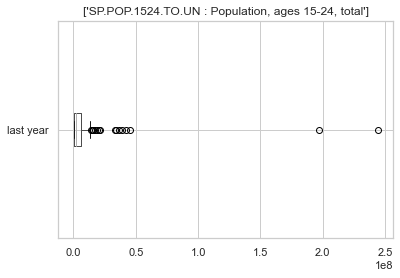

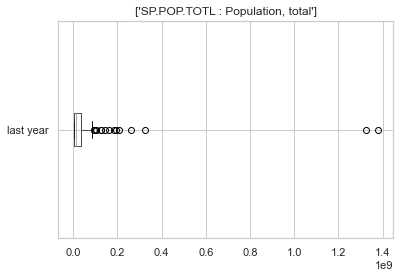

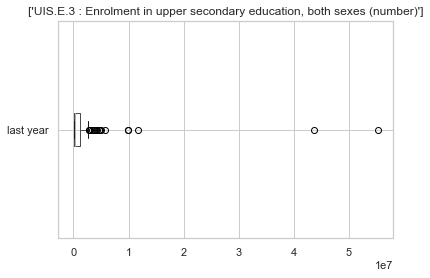

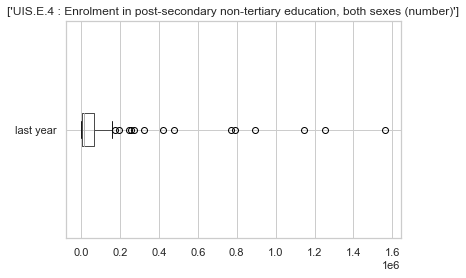

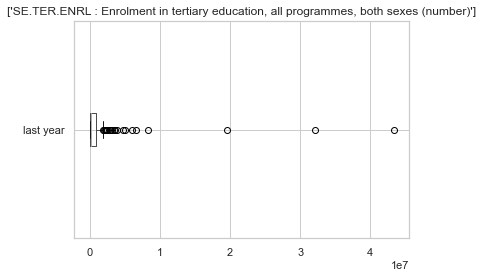

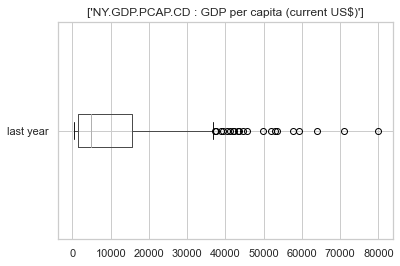

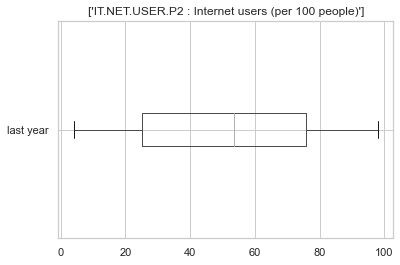

In [114]:
for indicateur in indicateurs:
    subset = data_final[data_final['Indicator Code']==indicateur]
    plt.title(indicateur + ' : ' + subset['Indicator Name'].unique())
    subset.boxplot(column="last year",vert=False)
    plt.show()

<AxesSubplot:xlabel='last year', ylabel='Indicator Code'>

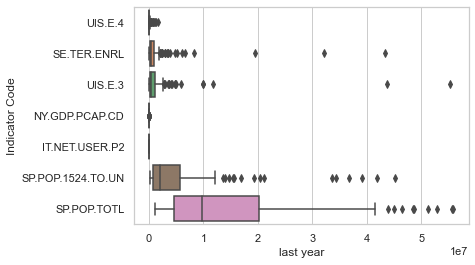

In [115]:
subset = data_final[data_final['last year']<6*1e7]

sns.boxplot(data=subset, x="last year", y="Indicator Code")

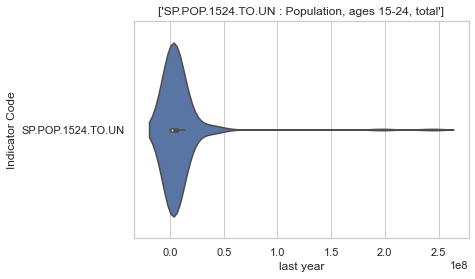

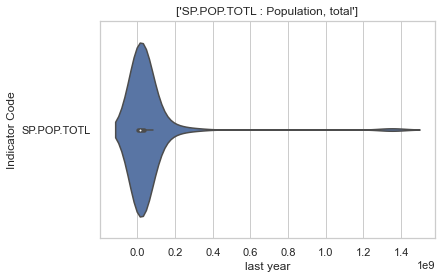

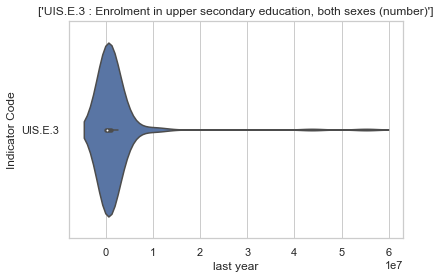

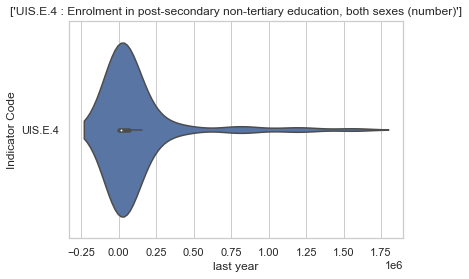

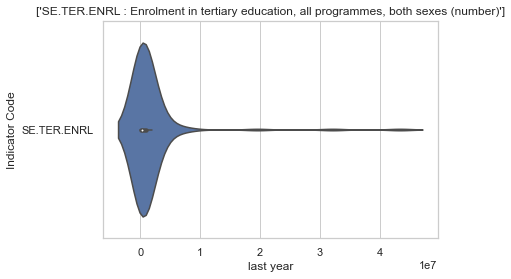

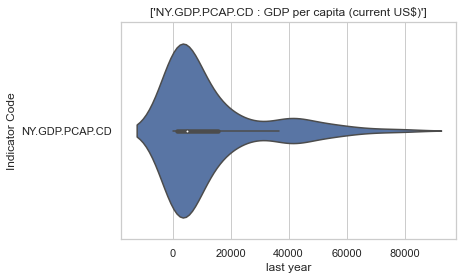

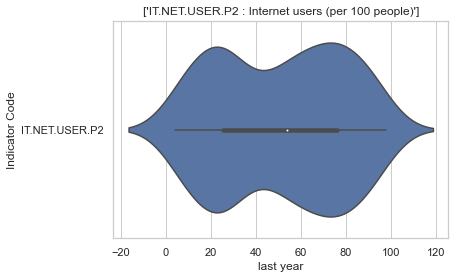

In [116]:
for indicateur in indicateurs:
    subset = data_final[data_final['Indicator Code']==indicateur]
    plt.title(indicateur + ' : ' + subset['Indicator Name'].unique())
    sns.violinplot(data=subset, x="last year", y="Indicator Code")
    plt.show()

### <a id="17"></a> 3.3 Indicateurs par région

Nous allons représenter le nombre de données puis la moyenne de chaque indicateur en fonction des régions.

Nombre de données présentes pour chaque indicateur en fonction des régions :


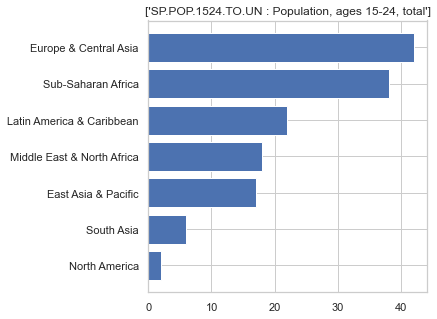

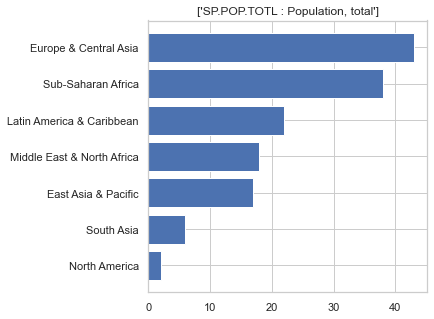

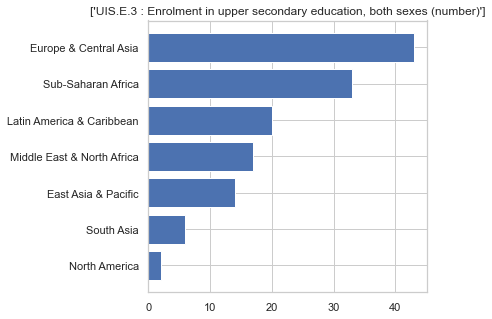

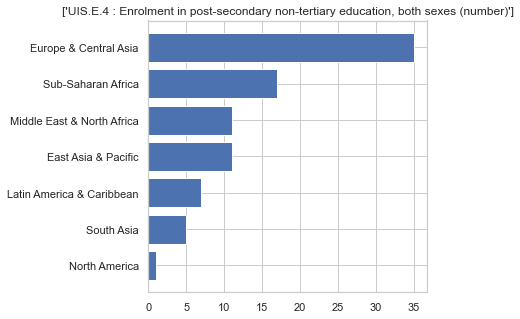

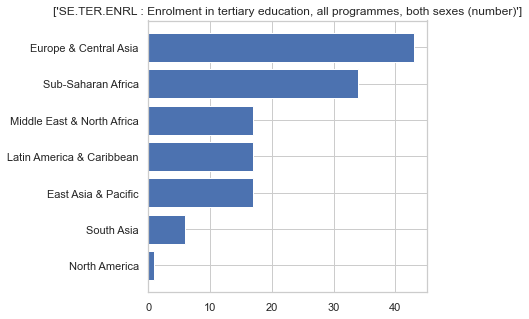

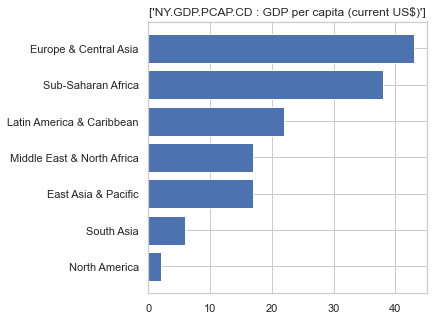

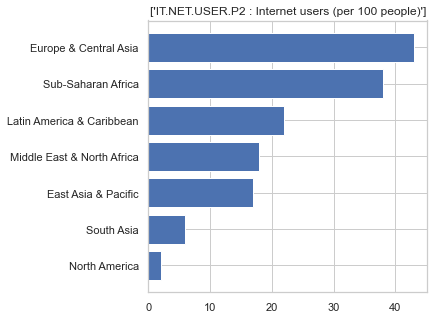

In [117]:
print('Nombre de données présentes pour chaque indicateur en fonction des régions :')
for indicateur in indicateurs :
    plt.figure(figsize=(5,5))
    plt.title(indicateur + ' : ' + data_final[data_final['Indicator Code']==indicateur]['Indicator Name'].unique())
    subset = data_final[data_final['Indicator Code']==indicateur].groupby('Region')['last year'].count().sort_values(ascending=True)
    plt.barh(y = subset.index,
             width = subset.values)

    plt.show()
    

Moyenne de chaque indicateur en fonction des régions :


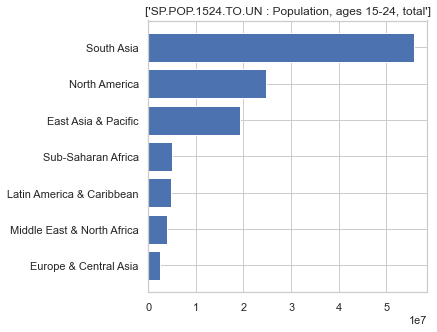

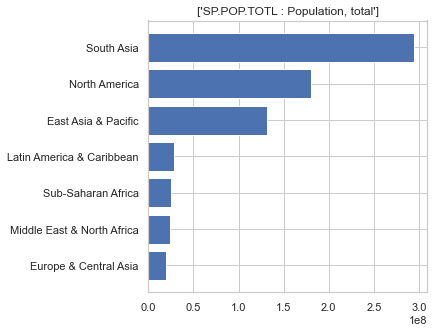

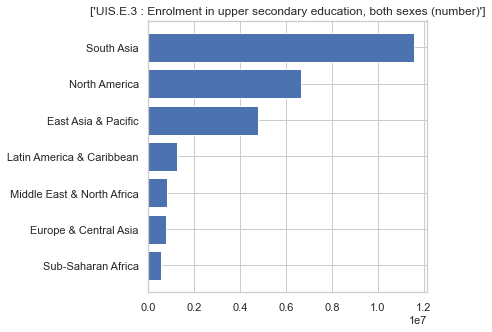

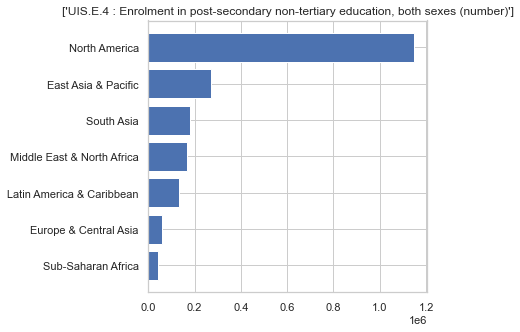

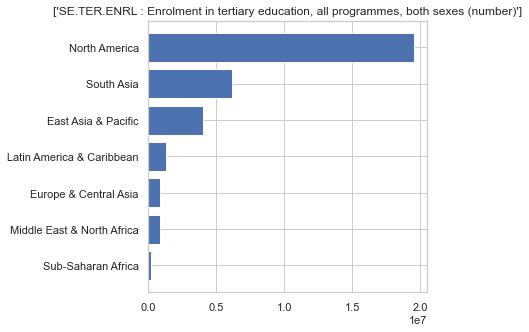

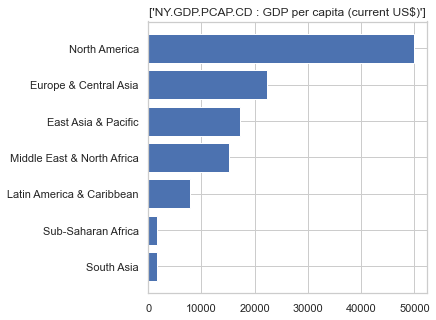

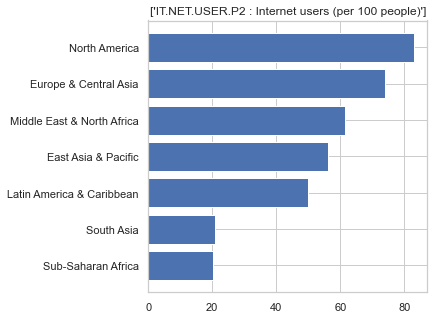

In [118]:
print('Moyenne de chaque indicateur en fonction des régions :')
for indicateur in indicateurs :
    plt.figure(figsize=(5,5))
    plt.title(indicateur + ' : ' + data_final[data_final['Indicator Code']==indicateur]['Indicator Name'].unique())
    subset = data_final[data_final['Indicator Code']==indicateur].groupby('Region')['last year'].mean().sort_values(ascending=True)
    plt.barh(y = subset.index,
             width = subset.values)
    plt.savefig('moyenne_indicateurs_regions.pdf')
    plt.show()

## <a id="18"></a> Scoring et Sélection des pays

Dans cette section, nous allons désormais analyser l'attractivité des différents pays pour un développement à l'international de l'entreprise *academy*. 

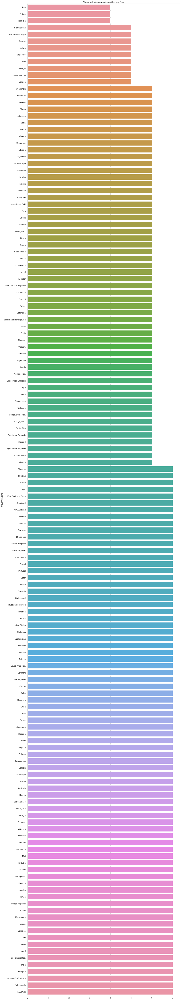

In [119]:
sns.set(style="whitegrid")
plt.figure(figsize=(15, 100))
plt.title("Nombre d'indicateurs disponibles par Pays")
plot = sns.barplot(x = data_final.groupby('Country Name')[['last year']].count().sum(axis=1).sort_values().values, 
                   y = data_final.groupby('Country Name')[['last year']].count().sum(axis=1).sort_values().index)
plt.show()

Nous allons déterminer un score de 1 à 5 pour chaque indicateur. La somme des scores des 7 indicateurs donnera une note finale (sur 35) pour chacun des pays. Nous pourrons alors déterminer quels pays sont les plus attractifs en fonction de leur score.

On construit un nouveau dataframe *table_scoring* qui contiendra tous les scores de chaque pays. 
Le score de chaque indicateur est construit en utilisant la fonction *pd.qcut()* qui est une fonction de discrétisation basée sur les quantiles.
Le score total est la somme des scores des 7 indicateurs et est donc sur 35.

In [120]:
table_scoring = pd.DataFrame(columns=['Country Name'])
                                      
table_scoring['Country Name'] = data_final['Country Name'].unique()     

table_scoring['Score SP.POP.1524.TO.UN'] = pd.to_numeric(pd.qcut(x = data_final.loc[data_final['Indicator Code']=='SP.POP.1524.TO.UN']['last year'].values,
                                                   q = 5,labels = [1,2,3,4,5]))
table_scoring['Score SP.POP.TOTL'] = pd.to_numeric(pd.qcut(x = data_final.loc[data_final['Indicator Code']=='SP.POP.TOTL']['last year'].values,
                                                   q = 5,labels = [1,2,3,4,5]))
table_scoring['Score UIS.E.3'] = pd.to_numeric(pd.qcut(x = data_final.loc[data_final['Indicator Code']=='UIS.E.3']['last year'].values,
                                                   q = 5,labels = [1,2,3,4,5]))
table_scoring['Score UIS.E.4'] = pd.to_numeric(pd.qcut(x = data_final.loc[data_final['Indicator Code']=='UIS.E.4']['last year'].values,
                                                   q = 5,labels = [1,2,3,4,5]))
table_scoring['Score SE.TER.ENRL'] = pd.to_numeric(pd.qcut(x = data_final.loc[data_final['Indicator Code']=='SE.TER.ENRL']['last year'].values,
                                                   q = 5,labels = [1,2,3,4,5]))
table_scoring['Score NY.GDP.PCAP.CD'] = pd.to_numeric(pd.qcut(x = data_final.loc[data_final['Indicator Code']=='NY.GDP.PCAP.CD']['last year'].values,
                                                   q = 5,labels = [1,2,3,4,5]))
table_scoring['Score IT.NET.USER.P2'] = pd.to_numeric(pd.qcut(x = data_final.loc[data_final['Indicator Code']=='IT.NET.USER.P2']['last year'].values,
                                                   q = 5,labels = [1,2,3,4,5]))
table_scoring = table_scoring.replace(np.nan, 0)

table_scoring['Score total'] = table_scoring['Score SP.POP.1524.TO.UN'] + table_scoring['Score SP.POP.TOTL'] + table_scoring['Score UIS.E.3'] + table_scoring['Score UIS.E.4'] + table_scoring['Score SE.TER.ENRL'] + table_scoring['Score NY.GDP.PCAP.CD'] + table_scoring['Score IT.NET.USER.P2']


In [121]:
table_scoring

,Country Name,Score SP.POP.1524.TO.UN,Score SP.POP.TOTL,Score UIS.E.3,Score UIS.E.4,Score SE.TER.ENRL,Score NY.GDP.PCAP.CD,Score IT.NET.USER.P2,Score total
0,Afghanistan,4.0,4,4.0,5.0,3.0,1.0,1,22.0
1,Albania,1.0,1,2.0,1.0,2.0,3.0,4,14.0
2,Algeria,4.0,4,4.0,0.0,4.0,3.0,3,22.0
3,Argentina,4.0,4,5.0,0.0,5.0,4.0,4,26.0
4,Armenia,1.0,1,1.0,0.0,2.0,2.0,4,11.0
5,Australia,3.0,4,4.0,5.0,4.0,5.0,5,30.0
6,Austria,2.0,2,3.0,3.0,4.0,5.0,5,24.0
7,Azerbaijan,3.0,3,3.0,4.0,2.0,3.0,4,22.0
8,Bahrain,1.0,1,1.0,2.0,1.0,5.0,5,16.0
9,Bangladesh,5.0,5,5.0,5.0,5.0,2.0,1,28.0


In [122]:
table_scoring.sort_values(by = 'Score total', ascending = False)

,Country Name,Score SP.POP.1524.TO.UN,Score SP.POP.TOTL,Score UIS.E.3,Score UIS.E.4,Score SE.TER.ENRL,Score NY.GDP.PCAP.CD,Score IT.NET.USER.P2,Score total
48,Germany,5.0,5,5.0,5.0,5.0,5.0,5,35.0
138,United States,5.0,5,5.0,5.0,5.0,5.0,4,34.0
44,France,5.0,5,5.0,4.0,5.0,5.0,5,34.0
65,Japan,5.0,5,5.0,3.0,5.0,5.0,5,33.0
26,China,5.0,5,5.0,5.0,5.0,4.0,3,32.0
137,United Kingdom,5.0,5,5.0,2.0,5.0,5.0,5,32.0
16,Brazil,5.0,5,5.0,5.0,5.0,4.0,3,32.0
109,Russian Federation,5.0,5,5.0,4.0,5.0,4.0,4,32.0
59,"Iran, Islamic Rep.",5.0,5,5.0,5.0,5.0,3.0,3,31.0
105,Poland,4.0,4,5.0,5.0,5.0,4.0,4,31.0


Nous selectionnons les 25 premiers pays du classements comme étant les pays les plus prometteurs pour l'expansion à l'international de la start-up *academy*.

In [123]:
pays_selectionnes = table_scoring.sort_values(by = 'Score total', ascending = False).head(25)
pays_selectionnes

,Country Name,Score SP.POP.1524.TO.UN,Score SP.POP.TOTL,Score UIS.E.3,Score UIS.E.4,Score SE.TER.ENRL,Score NY.GDP.PCAP.CD,Score IT.NET.USER.P2,Score total
48,Germany,5.0,5,5.0,5.0,5.0,5.0,5,35.0
138,United States,5.0,5,5.0,5.0,5.0,5.0,4,34.0
44,France,5.0,5,5.0,4.0,5.0,5.0,5,34.0
65,Japan,5.0,5,5.0,3.0,5.0,5.0,5,33.0
26,China,5.0,5,5.0,5.0,5.0,4.0,3,32.0
137,United Kingdom,5.0,5,5.0,2.0,5.0,5.0,5,32.0
16,Brazil,5.0,5,5.0,5.0,5.0,4.0,3,32.0
109,Russian Federation,5.0,5,5.0,4.0,5.0,4.0,4,32.0
59,"Iran, Islamic Rep.",5.0,5,5.0,5.0,5.0,3.0,3,31.0
105,Poland,4.0,4,5.0,5.0,5.0,4.0,4,31.0


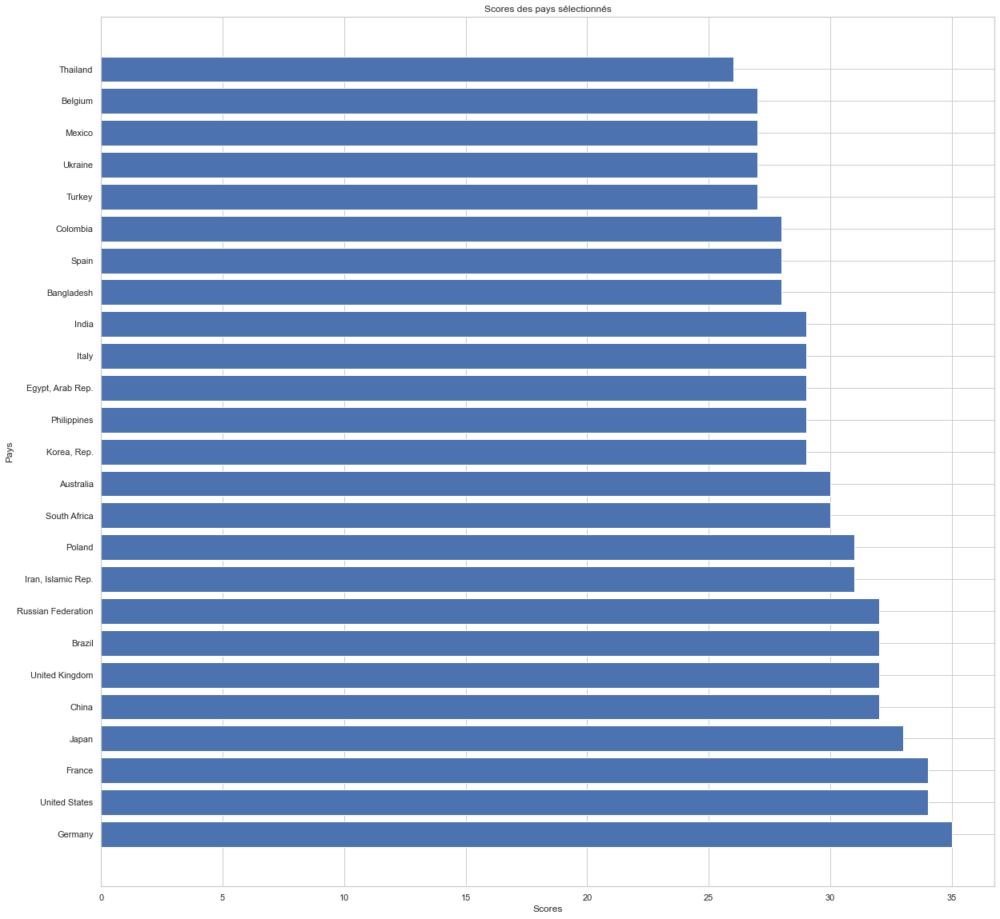

In [124]:
plt.figure(figsize=(20, 20))

plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score total'])
plt.xlabel('Scores')
plt.ylabel('Pays')
plt.title('Scores des pays sélectionnés')

plt.show()

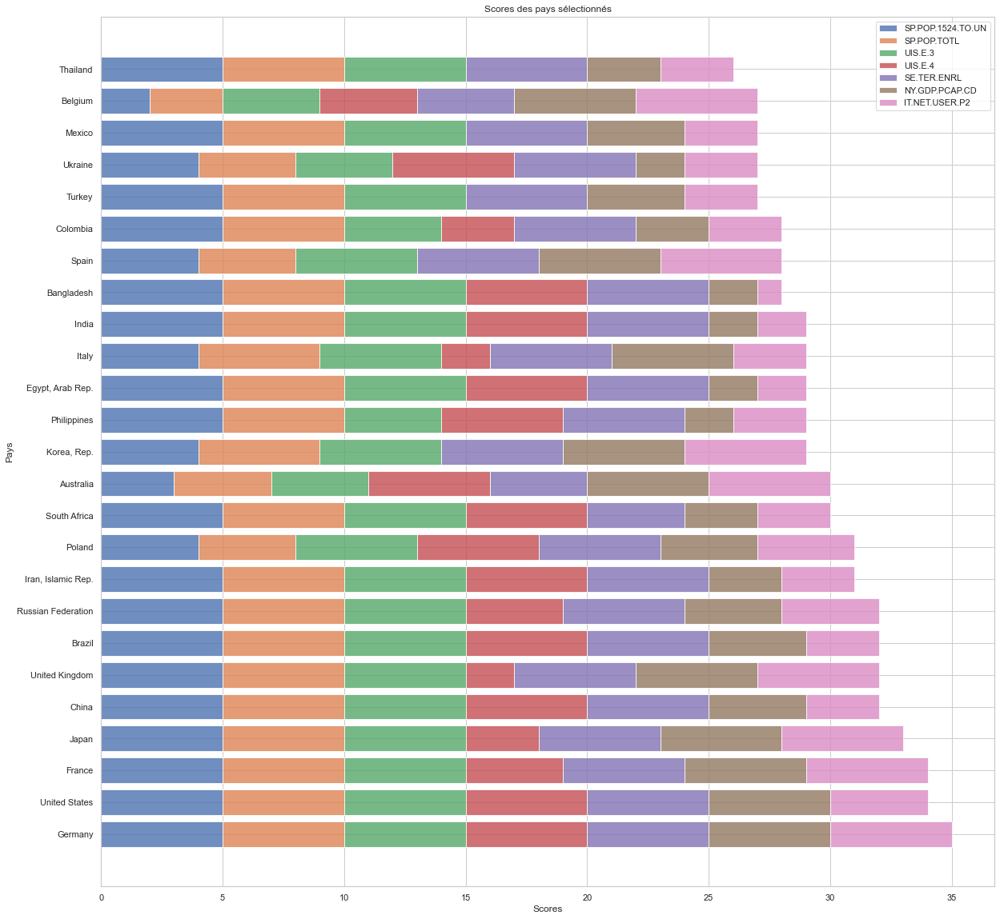

In [125]:
plt.figure(figsize=(20, 20))

plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score SP.POP.1524.TO.UN'], label='SP.POP.1524.TO.UN', alpha = 0.8)
plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score SP.POP.TOTL'], label='SP.POP.TOTL',
        left = pays_selectionnes['Score SP.POP.1524.TO.UN'], alpha = 0.8)
plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score UIS.E.3'], label='UIS.E.3',
        left = pays_selectionnes['Score SP.POP.1524.TO.UN']+pays_selectionnes['Score SP.POP.TOTL'], alpha = 0.8)
plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score UIS.E.4'], label='UIS.E.4',
        left = pays_selectionnes['Score SP.POP.1524.TO.UN']+pays_selectionnes['Score SP.POP.TOTL']+pays_selectionnes['Score UIS.E.3'],
        alpha = 0.8)
plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score SE.TER.ENRL'], label='SE.TER.ENRL',
        left = pays_selectionnes['Score SP.POP.1524.TO.UN']+pays_selectionnes['Score SP.POP.TOTL']+pays_selectionnes['Score UIS.E.3']+pays_selectionnes['Score UIS.E.4'],
        alpha = 0.8)
plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score NY.GDP.PCAP.CD'], label='NY.GDP.PCAP.CD',
        left = pays_selectionnes['Score SP.POP.1524.TO.UN']+pays_selectionnes['Score SP.POP.TOTL']+pays_selectionnes['Score UIS.E.3']+pays_selectionnes['Score UIS.E.4']+pays_selectionnes['Score SE.TER.ENRL'],
        alpha = 0.8)
plt.barh(pays_selectionnes['Country Name'], pays_selectionnes['Score IT.NET.USER.P2'], label='IT.NET.USER.P2',
        left = pays_selectionnes['Score SP.POP.1524.TO.UN']+pays_selectionnes['Score SP.POP.TOTL']+pays_selectionnes['Score UIS.E.3']+pays_selectionnes['Score UIS.E.4']+pays_selectionnes['Score SE.TER.ENRL']+pays_selectionnes['Score NY.GDP.PCAP.CD'],
         alpha = 0.8)


plt.xlabel('Scores')
plt.ylabel('Pays')
plt.title('Scores des pays sélectionnés')
plt.legend()
plt.savefig('scores_pays.pdf')
plt.show()

Représentons le détail des scores des 3 premiers pays de la liste sous la forme d'un radar chart.

In [141]:
import plotly.express as px

for i in range(0,4):
    df = pays_selectionnes.iloc[i].drop(['Country Name','Score total'])
    
    print(pays_selectionnes.iloc[i]['Country Name'],':')
    fig = px.line_polar(df, r=df.values, theta=df.index, line_close=True)
    fig.update_traces(fill='toself')
    
    fig.show()

Germany :


United States :


France :


Japan :


In [127]:
pip install worldmap

Note: you may need to restart the kernel to use updated packages.


In [173]:
import worldmap as worldmap

pays = pays_selectionnes['Country Name'].tolist()
pays.remove('France')

out = worldmap.plot(pays, cmap='Blues', map_name='world', verbose=True, showfig=True)

/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/worldmap/utils/stringPreprocessing.py:269: FutureWarning:

The default value of regex will change from True to False in a future version.

100%|██████████| 1/1 [00:00<00:00, 22.48it/s]
/Users/oceaneyouyoutte/opt/anaconda3/lib/python3.8/site-packages/worldmap/utils/stringPreprocessing.py:269: FutureWarning:

The default value of regex will change from True to False in a future version.

  8%|▊         | 2/24 [00:00<00:01, 19.20it/s]

[worldmap] Map loaded and parsed: worldHigh.svg


100%|██████████| 24/24 [00:01<00:00, 22.20it/s]


[worldmap] 24 out of 24 cities/counties detected and processed.
[worldmap] Writing custom map to file: custom_map.svg
[worldmap] Fin!


On suppose que l'entreprise est déjà implantée en France donc on peut supprimer ce pays des pays dans lesquels implanter *academy*.

La carte obtenue colore les différents pays selectionnés. Les pays en bleu clair sont ceux ayant un meilleur score que ceux en bleu plus foncé.

Plus les pays sont clairs, plus il est pertinent de s'implanter dans ceux-ci dans le cadre du développement de l'entreprise.

## <a id="19"></a> Analyse prospective

Nous allons analyser la tendance d'évolution des différents indicateurs sur les 5 à 10 prochaines années. Ainsi, nous pourrons déterminer quels sont les pays, parmi ceux selectionnés, qui ont les prédictions de croissance les plus importantes.

Pour commencer, nous allons d'abord déterminer quels indicateurs disposent de données futures. 

In [174]:
data_futur

,Country Name,Country Code,Indicator Name,Indicator Code,2020,2025,2030,2035,2040,2045,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Region
1171,Arab World,ARB,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1204,Arab World,ARB,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1214,Arab World,ARB,"Enrolment in upper secondary education, both s...",UIS.E.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1245,Arab World,ARB,GDP per capita (current US$),NY.GDP.PCAP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1375,Arab World,ARB,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2482,Arab World,ARB,"Population, ages 15-24, total",SP.POP.1524.TO.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2533,Arab World,ARB,"Population, total",SP.POP.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4836,East Asia & Pacific,EAS,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4869,East Asia & Pacific,EAS,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4879,East Asia & Pacific,EAS,"Enrolment in upper secondary education, both s...",UIS.E.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [175]:
data_futur[data_futur['Indicator Code'].isin(indicateurs)].groupby(['Region','Country Name','Indicator Code']).mean()

2020  \
Region                     Country Name                   Indicator Code            
East Asia & Pacific        American Samoa                 IT.NET.USER.P2      NaN   
                                                          NY.GDP.PCAP.CD      NaN   
                                                          SE.TER.ENRL         NaN   
                                                          SP.POP.1524.TO.UN   NaN   
                                                          SP.POP.TOTL         NaN   
                                                          UIS.E.3             NaN   
                                                          UIS.E.4             NaN   
                           Australia                      IT.NET.USER.P2      NaN   
                                                          NY.GDP.PCAP.CD      NaN   
                                                          SE.TER.ENRL         NaN   
                                                          SP.POP.1524.TO.UN   NaN   
                                                          SP.POP.TOTL         NaN   
                                                          UIS.E.3             NaN   
                                                          UIS.E.4             NaN   
                           Brunei Darussalam              IT.NET.USER.P2      NaN   
                                                          NY.GDP.PCAP.CD      NaN   
                                                          SE.TER.ENRL         NaN   
                                                          SP.POP.1524.TO.UN   NaN   
                                                          SP.POP.TOTL         NaN   
                                                          UIS.E.3             NaN   
                                                          UIS.E.4             NaN   
                           Cambodia                       IT.NET.USER.P2      NaN   
                                                          NY.GDP.PCAP.CD      NaN   
                                                          SE.TER.ENRL         NaN   
                                                          SP.POP.1524.TO.UN   NaN   
                                                          SP.POP.TOTL         NaN   
                                                          UIS.E.3             NaN   
                                                          UIS.E.4             NaN   
                           China                          IT.NET.USER.P2      NaN   
                                                          NY.GDP.PCAP.CD      NaN   
                                                          SE.TER.ENRL         NaN   
                                                          SP.POP.1524.TO.UN   NaN   
                                                          SP.POP.TOTL         NaN   
                                                          UIS.E.3             NaN   
                                                          UIS.E.4             NaN   
                           Fiji                           IT.NET.USER.P2      NaN   
                                                          NY.GDP.PCAP.CD      NaN   
                                                          SE.TER.ENRL         NaN   
                                                          SP.POP.1524.TO.UN   NaN   
                                                          SP.POP.TOTL         NaN   
                                                          UIS.E.3             NaN   
                                                          UIS.E.4             NaN   
                           French Polynesia               IT.NET.USER.P2      NaN   
                                                          NY.GDP.PCAP.CD      NaN   
                                                          SE.TER.ENRL         NaN   
                                                          SP.POP.1524.TO.UN   NaN 

In [176]:
data_futur = data_futur[data_futur['Indicator Code'].isin(indicateurs)]
data_futur

,Country Name,Country Code,Indicator Name,Indicator Code,2020,2025,2030,2035,2040,2045,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Region
1171,Arab World,ARB,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1204,Arab World,ARB,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1214,Arab World,ARB,"Enrolment in upper secondary education, both s...",UIS.E.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1245,Arab World,ARB,GDP per capita (current US$),NY.GDP.PCAP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1375,Arab World,ARB,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2482,Arab World,ARB,"Population, ages 15-24, total",SP.POP.1524.TO.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2533,Arab World,ARB,"Population, total",SP.POP.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4836,East Asia & Pacific,EAS,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4869,East Asia & Pacific,EAS,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4879,East Asia & Pacific,EAS,"Enrolment in upper secondary education, both s...",UIS.E.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [177]:
data_futur.describe()

,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [178]:
data_futur_short = data_futur[data_futur['Country Name'].isin(pays)]
data_futur_short

,Country Name,Country Code,Indicator Name,Indicator Code,2020,2025,2030,2035,2040,2045,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Region
129446,Australia,AUS,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia & Pacific
129479,Australia,AUS,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia & Pacific
129489,Australia,AUS,"Enrolment in upper secondary education, both s...",UIS.E.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia & Pacific
129520,Australia,AUS,GDP per capita (current US$),NY.GDP.PCAP.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia & Pacific
129650,Australia,AUS,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia & Pacific
130757,Australia,AUS,"Population, ages 15-24, total",SP.POP.1524.TO.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia & Pacific
130808,Australia,AUS,"Population, total",SP.POP.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia & Pacific
147771,Bangladesh,BGD,Enrolment in post-secondary non-tertiary educa...,UIS.E.4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,South Asia
147804,Bangladesh,BGD,"Enrolment in tertiary education, all programme...",SE.TER.ENRL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,South Asia
147814,Bangladesh,BGD,"Enrolment in upper secondary education, both s...",UIS.E.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,South Asia


In [181]:
data_futur_short.shape

(168, 22)

In [179]:
data_futur_short.groupby(['Region','Country Name','Indicator Code']).mean()

2020  2025  \
Region                     Country Name       Indicator Code                  
East Asia & Pacific        Australia          IT.NET.USER.P2      NaN   NaN   
                                              NY.GDP.PCAP.CD      NaN   NaN   
                                              SE.TER.ENRL         NaN   NaN   
                                              SP.POP.1524.TO.UN   NaN   NaN   
                                              SP.POP.TOTL         NaN   NaN   
                                              UIS.E.3             NaN   NaN   
                                              UIS.E.4             NaN   NaN   
                           China              IT.NET.USER.P2      NaN   NaN   
                                              NY.GDP.PCAP.CD      NaN   NaN   
                                              SE.TER.ENRL         NaN   NaN   
                                              SP.POP.1524.TO.UN   NaN   NaN   
                                              SP.POP.TOTL         NaN   NaN   
                                              UIS.E.3             NaN   NaN   
                                              UIS.E.4             NaN   NaN   
                           Japan              IT.NET.USER.P2      NaN   NaN   
                                              NY.GDP.PCAP.CD      NaN   NaN   
                                              SE.TER.ENRL         NaN   NaN   
                                              SP.POP.1524.TO.UN   NaN   NaN   
                                              SP.POP.TOTL         NaN   NaN   
                                              UIS.E.3             NaN   NaN   
                                              UIS.E.4             NaN   NaN   
                           Korea, Rep.        IT.NET.USER.P2      NaN   NaN   
                                              NY.GDP.PCAP.CD      NaN   NaN   
                                              SE.TER.ENRL         NaN   NaN   
                                              SP.POP.1524.TO.UN   NaN   NaN   
                                              SP.POP.TOTL         NaN   NaN   
                                              UIS.E.3             NaN   NaN   
                                              UIS.E.4             NaN   NaN   
                           Philippines        IT.NET.USER.P2      NaN   NaN   
                                              NY.GDP.PCAP.CD      NaN   NaN   
                                              SE.TER.ENRL         NaN   NaN   
                                              SP.POP.1524.TO.UN   NaN   NaN   
                                              SP.POP.TOTL         NaN   NaN   
                                              UIS.E.3             NaN   NaN   
                                              UIS.E.4             NaN   NaN   
                           Thailand           IT.NET.USER.P2      NaN   NaN   
                                              NY.GDP.PCAP.CD      NaN   NaN   
                                              SE.TER.ENRL         NaN   NaN   
                                              SP.POP.1524.TO.UN   NaN   NaN   
                                              SP.POP.TOTL         NaN   NaN   
                                              UIS.E.3             NaN   NaN   
                                              UIS.E.4             NaN   NaN   
Europe & Central Asia      Belgium            IT.NET.USER.P2      NaN   NaN   
                                              NY.GDP.PCAP.CD      NaN   NaN   
                                              SE.TER.ENRL         NaN   NaN   
                                              SP.POP.1524.TO.UN   NaN   NaN   
                                              SP.POP.TOTL         NaN   NaN   
                                              UIS.E.3             NaN   NaN   
                                              UIS.E.4             NaN   NaN   
                           Germany  

In [162]:
data_futur_short.describe()

,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [163]:
data_c

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886925,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, male...",UIS.LP.AG15T24.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886926,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886927,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, f...",SE.ADT.1524.LT.FE.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886928,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, g...",SE.ADT.1524.LT.FM.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<ipython-input-168-bcbe86b83760>:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



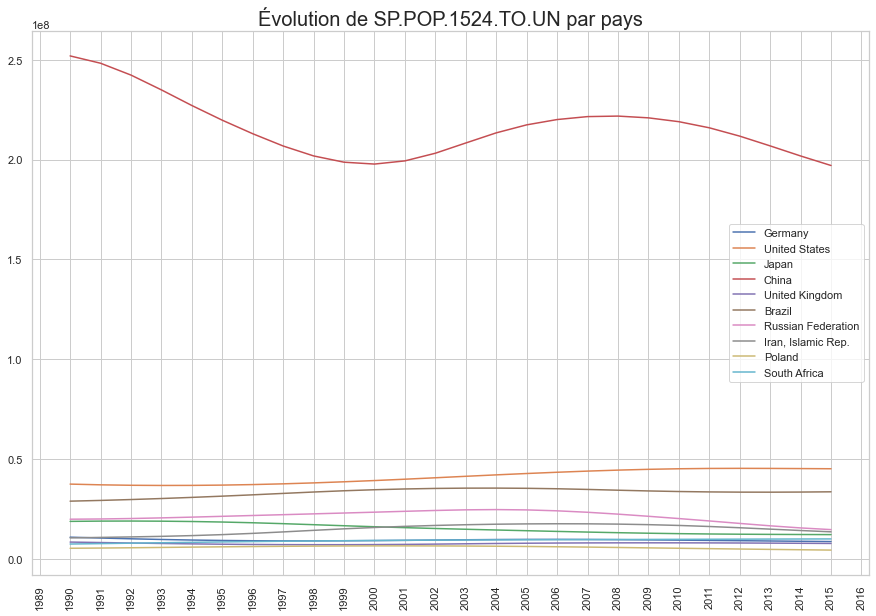

<ipython-input-168-bcbe86b83760>:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



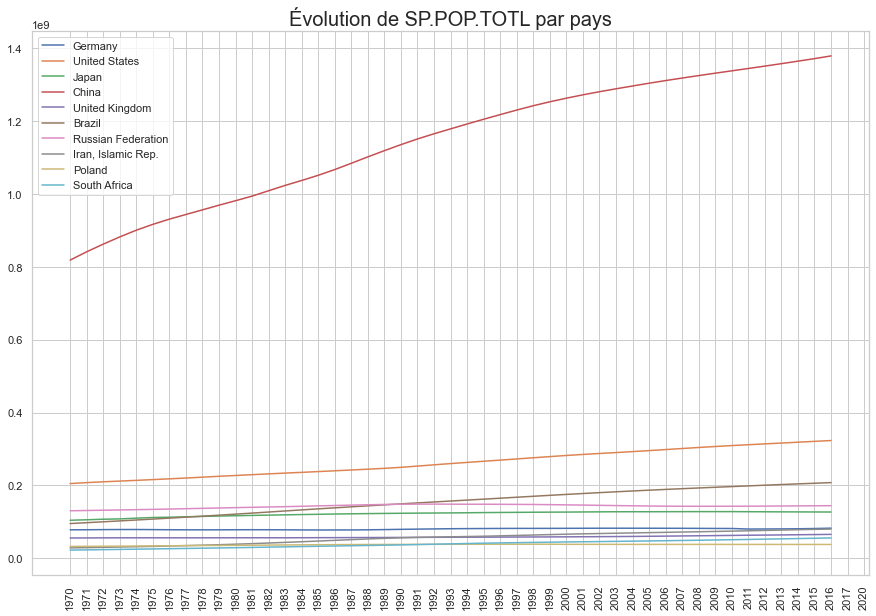

<ipython-input-168-bcbe86b83760>:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



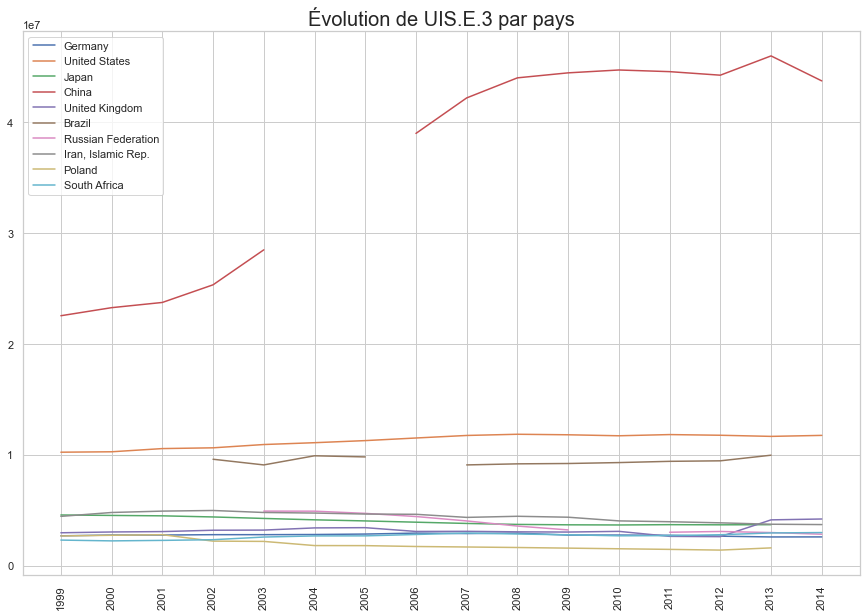

<ipython-input-168-bcbe86b83760>:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



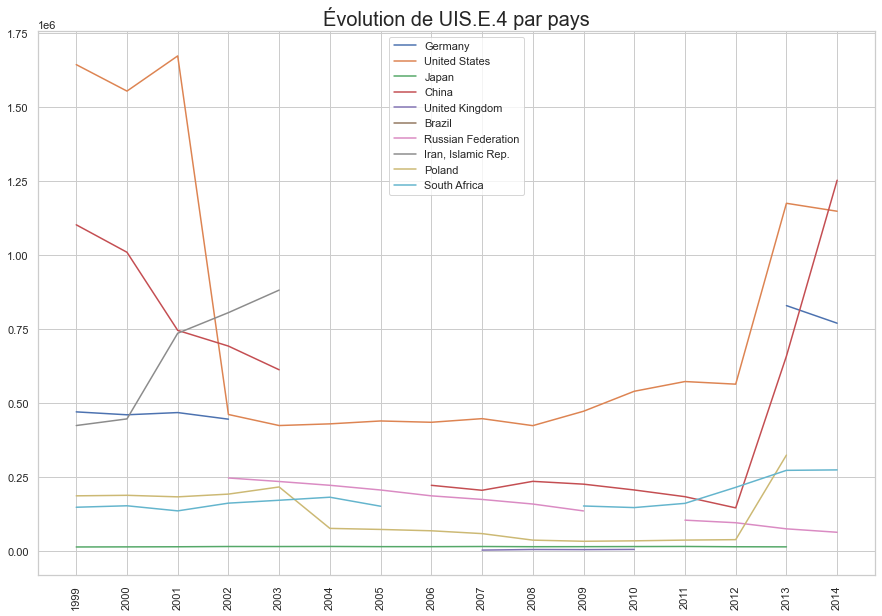

<ipython-input-168-bcbe86b83760>:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



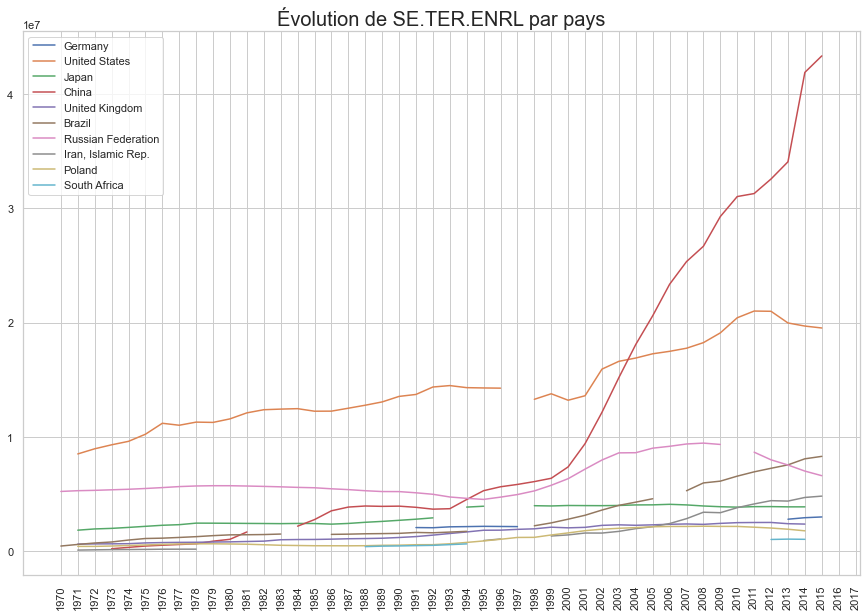

<ipython-input-168-bcbe86b83760>:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



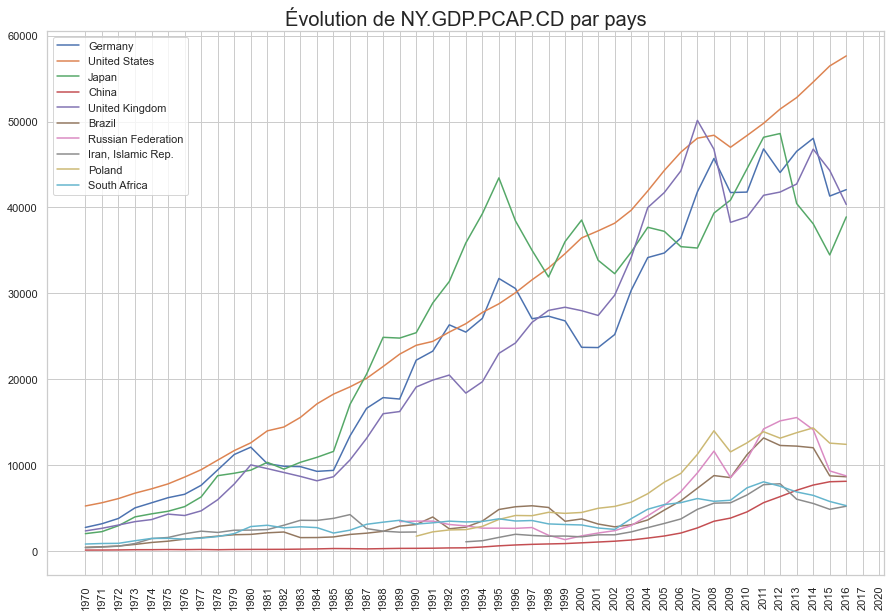

<ipython-input-168-bcbe86b83760>:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



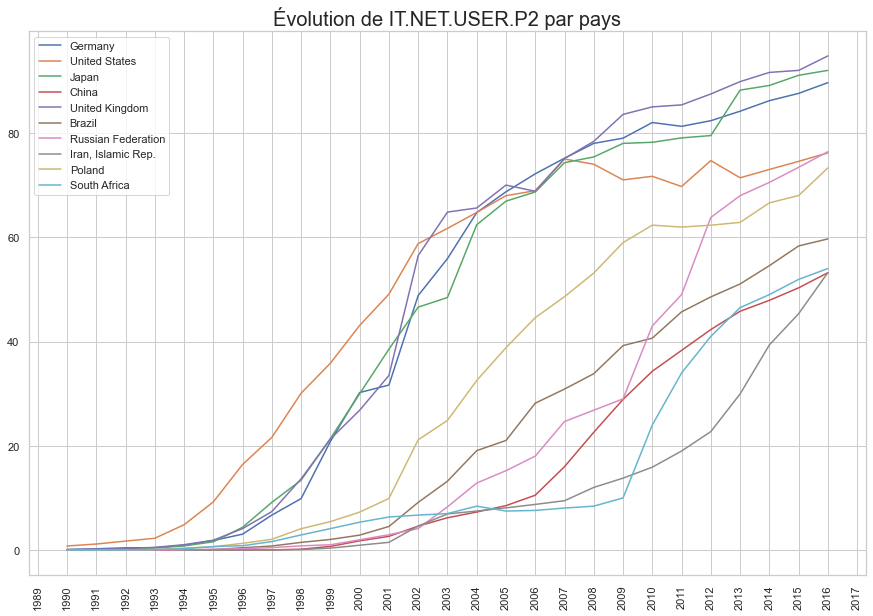

In [168]:
for indicateur in indicateurs:
    plt.figure(figsize = (15,10))
    plt.title("Évolution de " + indicateur + " par pays", size=20)
    ax = plt.axes()
    plt.xticks(rotation=90)
    for country in pays[0:10]:
        ax.plot(data_c.loc[(data_c['Country Name']==country) & (data_c['Indicator Code']==indicateur)].iloc[:,4:].columns,
                data_c.loc[(data_c['Country Name']==country) & (data_c['Indicator Code']==indicateur)].iloc[:,4:].values.reshape(65,),
               label = country)       
    plt.legend()
    plt.show()

Conclusions que l'on peut tirer des graphes :

- La population totale et la population âgée de 15 à 24 ans en Chine surpasse les autres pays. Il en est de même pour le nombre d'inscription dans l'enseignement secondaire supérieur. Ces deux pays sont dans la liste notamment car ils représentent énormément de clients potentiels dû à leur population importante et grandissante.
- L'évolution du nombre d'inscriptions dans l'enseignement supérieur, le PIB par habitant, mais également le nombre d'utilisateur d'internet sont en forte augmentation sur les dernières années.

Nous ne pouvons pas réaliser d'analyse prospective car nous ne disposons pas de données futures pour les indicateurs sélectionnés.
Cependant, les observations que nous pouvons tirer nous indiquent une forte augmentation de la valeur des indicateurs sur les dernières années renseignées. Cela nous permet de supposer que l'évolution des indicateurs pour ces pays va continuer à suivre cette tendance. En effet, on peut supposer que la population va continuer de croître de même que la population cible (c'est-à-dire la tranche d'âge 15-24 ans et les lycéens et étudiants). De plus, les pays pour lesquels internet semblent moins implantés vont connaître une plus grande utilisation d'internet dans les prochaines années. L'augmentation de ces indicateurs conduiraient donc à l'augmentation des clients potentiels. 

## <a id="20"></a> Conclusion

Le but de cette analyse était de réaliser une première mission d’analyse exploratoire, pour déterminer si les données sur l’éducation de la banque mondiale permettent d’informer le projet d’expansion de la start-up de la EdTech, nommée academy, qui propose des contenus de formation en ligne pour un public de niveau lycée et université.

À la suite de l'analyse, nous pouvons conclure que les pays avec un fort potentiel de clients pour les services fournis par l'entreprise sont :

In [165]:
pays

['Germany',
 'United States',
 'Japan',
 'China',
 'United Kingdom',
 'Brazil',
 'Russian Federation',
 'Iran, Islamic Rep.',
 'Poland',
 'South Africa',
 'Australia',
 'Korea, Rep.',
 'Philippines',
 'Egypt, Arab Rep.',
 'Italy',
 'India',
 'Bangladesh',
 'Spain',
 'Colombia',
 'Turkey',
 'Ukraine',
 'Mexico',
 'Belgium',
 'Thailand']

Les pays sont classés en fonction de leur score total. Les premiers pays sont donc ceux dans lesquels l'entreprise doit opérer en priorité.


Le dataset est bien composé de données portant sur le domaine éducatif et tous les pays sont représentés. De plus, les sources des données sont renseignées.
Cependant le dataset possède beaucoup de valeurs manquantes, particulièrement pour les années futures. En effet, pour la plupart des indicateurs du dataset, il n'est pas possible de réaliser d'analyse prospective puisqu'il n'y a pas de données renseignées. De même, certains pays ont été éliminés assez tôt de la liste de pays potentiellement pertinents pour l'expansion de l'entreprise, car ces derniers ne disposaient pas de suffisamment de données.
Les données de la Banque Mondiale sont donc insuffisantes pour assurer avec certitude la pertinence des pays dans lesquels s'implanter. 